# Prediction of the perturbed genes via translation of image-based gene perturbation to regulatory gene embedding

---

This notebook is used to infer a map from the image-based gene perturbation embeddings to the corresponding regulatory gene embeddings in order to enable the out-of-sample prediction of unseen overexpression conditions. To this end, we will make use of the different image-embeddings and morphological profiles obtained from the JUMP data set as well as the regulatory gene embeddings also used in our previous analyses using the data from Rohban et al.

To learn the map we will use the 31 OE conditions that are the subset of the 41 OE conditions from the Rohban data set that we had identified as impacting the chromatin organization which are also covered by the JUMP data set. We will then evaluate the performance of our translation by aiming to predict up to 144 additional OE conditions.

This validation task is actually significantly more difficult than the leave-one-target-out cross-validation setup described in the paper. This is because a) we have substantially less training than test conditions, b) the gene targets of the test conditions tend to be related to pathways not (well) represented among the training conditions, c) the JUMP data shows strong batch effects which dominate the used embedding structures or whose removal seems to reduce the biological signal in the embeddings required to group OE conditions by common effects on the chromatin organization.

To address those challenges, we will employ to strategies:
- To assess how much the imbalance of the training and test conditions affects the performance, we will use the identified clusters of the regulatory gene embeddings and assess the prediction performance for each cluster individually.
- To address the issue of the different batch effects, we will assess the prediction performance using not only the global but also the batch-wise means of the condition-specific embeddings as input to learn the translation. Additionally, we aim to introduce some invariance of the map to the individual batch information by adding these as an additional input features when learning the map.

The performance of all configurations and input gene perturbation embeddings is measured in terms of the kNN accuracy. In particular, the overall procedure will look as follows:
1. Given the image embeddings of the cells in the 175 OE conditions, we will obtain the corresponding gene perturbation embeddings as the condition-wise mean of these embeddings.
2. We will select the 31 OE conditions which are the subset of the 41 impactful gene perturbation settings from the Rohban et al. (2017) data set that are part of the selected 175 conditions of the JUMP data set.
3. We will learn a NTK-based map as described in our paper using these 31 condition that given a image-based gene perturbation embedding predicts the corresponding regulatory gene embedding.
4. Using the learned map, we will obtain predictions of the regulatory gene embeddings for the perturbed gene targets of the remaining 144/175 OE conditions in our data set.
5. Finally, we evaluate the prediction performance for those 144 OE conditions using the k-nearest neighbor accuracy and compare those against a baseline that is equivalent to random chance as described in the paper.

---

## Environmental setup

First, we load in all required software packages and define the required functions.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import copy
from torch import nn
from torch.optim import Adam
import sys
from tqdm.notebook import tqdm
from torch.utils.data import DataLoader
import matplotlib as mpl
from sklearn.preprocessing import normalize
import os
import rff
import pickle
import traceback
import time
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.kernel_ridge import KernelRidge

sys.path.append("../../../..")

from src.utils.notebooks.translation.analysis import *
from src.data.datasets import IndexedTensorDataset
from src.utils.basic.io import get_genesets_from_gmt_file, get_file_list

mpl.rcParams["figure.dpi"] = 600


seed = 1234

device = "cuda:0"

%reload_ext nb_black

<IPython.core.display.Javascript object>

In [2]:
def label_point(
    x, y, val, ax, reg_size=10, highlight_size=10, highlight=None, highlight_other=None
):
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    for i in range(len(x)):
        if highlight is not None and val[i] == highlight:
            c = "r"
            weight = "bold"
            size = highlight_size
        elif highlight_other is not None and val[i] in highlight_other:
            c = "b"
            weight = "bold"
        else:
            c = "k"
            weight = "normal"
            size = reg_size
        if x[i] > xmin and x[i] < xmax and y[i] > ymin and y[i] < ymax:
            ax.text(x[i] + 0.02, y[i], val[i], {"size": size, "c": c, "weight": weight})

<IPython.core.display.Javascript object>

In [3]:
class SyntheticInterventionModel:
    def __init__(self):
        super().__init__()
        self.alpha = None
        self.X_train = None
        self.Y_train = None

    def fit(self, X_train, Y_train):
        self.X_train = X_train
        self.Y_train = Y_train
        return self

    def predict(self, X_test):
        self.alpha = np.matmul(X_test, np.linalg.pinv(self.X_train))
        y_test = np.matmul(self.alpha, self.Y_train)
        return y_test

<IPython.core.display.Javascript object>

In [4]:
class MeanModel:
    def __init__(self):
        super().__init__()
        self.Y_mean = None

    def fit(self, X_train, Y_train):
        self.Y_mean = Y_train
        return self

    def predict(self, X_test=None):
        return np.repeat(self.Y_mean, len(X_test), axis=0)

<IPython.core.display.Javascript object>

In [5]:
class RandomModel:
    def __init__(self):
        super().__init__()
        self.Y_train = None

    def fit(self, X_train, Y_train):
        self.Y_train = Y_train
        return self

    def predict(self, X_test=None):
        test_idc = np.random.randint(0, len(self.Y_train), size=len(X_test))
        Y_test = self.Y_train[test_idc]
        return Y_test

<IPython.core.display.Javascript object>

In [6]:
def compute_area_under_the_knn_curve(knn_acc_results, max_k=51):
    knn_accs = knn_acc_results.loc[knn_acc_results.k < max_k + 1, "knn_acc"]
    return np.sum(knn_accs) / max_k

<IPython.core.display.Javascript object>

In [7]:
def get_jump_knn_hit_data(nn_dict):
    idc = []
    hits = []
    for (k, v) in nn_dict:
        idc.append(k)
        hits.append(np.where(v == k)[0])
    hit_results = pd.DataFrame(np.array(hits), columns=["knn_hit"], index=idc)
    return hit_results

<IPython.core.display.Javascript object>

In [8]:
def get_knn_hit_data(nn_dict):
    idc = []
    hits = []
    for k, v in nn_dict.items():
        idc.append(k)
        hits.append(np.where(v == k)[0])
    hit_results = pd.DataFrame(np.array(hits), columns=["knn_hit"], index=idc)
    return hit_results

<IPython.core.display.Javascript object>

In [9]:
from numpy.linalg import solve


class NTK:
    def __init__(self, reg=1):
        super().__init__()
        self.reg = reg
        self.sol = None
        self.Xtrain = None

    def kernel(self, pair1, pair2):

        out = pair1 @ pair2.T + 1
        N1 = np.sum(np.power(pair1, 2), axis=-1).reshape(-1, 1) + 1
        N2 = np.sum(np.power(pair2, 2), axis=-1).reshape(-1, 1) + 1

        XX = np.sqrt(N1 @ N2.T)
        out = out / XX

        out = np.clip(out, -1, 1)

        first = (
            1
            / np.pi
            * (out * (np.pi - np.arccos(out)) + np.sqrt(1.0 - np.power(out, 2)))
            * XX
        )
        sec = 1 / np.pi * out * (np.pi - np.arccos(out)) * XX
        out = first + sec

        C = 1
        return out / C

    def fit(self, Xtrain, ytrain):
        K = self.kernel(Xtrain, Xtrain)
        sol = solve(K + self.reg * np.eye(len(K)), ytrain).T
        self.sol = sol
        self.Xtrain = Xtrain
        return self

    def predict(self, X):
        K = self.kernel(self.Xtrain, X)
        return (self.sol @ K).T

<IPython.core.display.Javascript object>

In [10]:
def get_jump_input_and_target_features(
    X_train,
    Y_train,
    X_test,
    use_y_train_mean=False,
    use_y_mean=False,
    Y_train_mean=None,
    Y_mean=None,
    Y_all=None,
    n_neighbors_weights_features=0,
    n_weight_encodings=10,
    neighbor_weight_encoding="positional",
    append_neighbor_embs=None,
    rff_sigma=1,
    cache_dir=None,
    use_batch_labels=False,
    train_batch_labels=None,
    test_batch_labels=None,
):
    pert_train_samples = list(X_train.index)
    test_target = list(X_test.index)[0]
    X_train = np.array(X_train)
    Y_train = np.array(Y_train)
    X_test = np.array(X_test)

    if use_batch_labels:
        ohe = OneHotEncoder()
        encoded_batch_labels = ohe.fit_transform(
            np.concatenate([train_batch_labels, test_batch_labels], axis=-1).reshape(
                -1, 1
            )
        ).toarray()
        encoded_train_batch_labels = encoded_batch_labels[: len(train_batch_labels)]
        encoded_test_batch_labels = encoded_batch_labels[len(train_batch_labels) :]
        X_train = np.concatenate([X_train, encoded_train_batch_labels], axis=-1)
        X_test = np.concatenate([X_test, encoded_test_batch_labels], axis=-1)

    if use_y_train_mean and Y_train_mean is not None:
        Y_train_mean = np.array(Y_train_mean).reshape(1, -1)
        X_train = np.concatenate([X_train, Y_train_mean], axis=-1)
        X_test = np.concatenate(
            [X_test, np.repeat(Y_train_mean[0].reshape(1, -1), len(X_test), axis=0)],
            axis=-1,
        )
    if use_y_mean and Y_mean is not None:
        Y_mean = np.array(Y_mean).reshape(1, -1)
        X_train = np.concatenate(
            [X_train, np.repeat(Y_mean, len(X_train), axis=0)], axis=-1
        )
        X_test = np.concatenate(
            [X_test, np.repeat(Y_mean, len(X_test), axis=0)],
            axis=-1,
        )

    ## Use Random Fourier Features of nearest neighbors of the training image embeddings
    if n_neighbors_weights_features > 0:
        nn = NearestNeighbors(n_neighbors=n_neighbors_weights_features)
        nn = nn.fit(X_train)
        X_train_and_test = np.concatenate([X_train, X_test], axis=0)
        neighbors_idcs = nn.kneighbors(X_train_and_test, return_distance=False)

        # Use cached SI coefficients if those are available to redce run-time
        # If the file does not exist but a cache directory is given - the SI coefficients are cached.
        try:
            filehandler = open(
                os.path.join(
                    cache_dir,
                    "neighbor_weights_{}_{}.pkl".format(
                        test_target, n_neighbors_weights_features
                    ),
                ),
                "rb",
            )
            neighbor_weights = pickle.load(filehandler)
            filehandler.close()
        except Exception:
            neighbor_weights = []
            for i in range(len(X_train_and_test)):
                neighbors_idc = neighbors_idcs[i]
                neighbors = X_train[neighbors_idc]
                neighbor_weight = np.matmul(
                    X_train_and_test[i], np.linalg.pinv(neighbors)
                )
                neighbor_weights.append(neighbor_weight)
            neighbors_weights = np.array(neighbor_weights)

            if cache_dir is not None:
                os.makedirs(cache_dir, exist_ok=True)
                filehandler = open(
                    os.path.join(
                        cache_dir,
                        "neighbor_weights_{}_{}.pkl".format(
                            test_target, n_neighbors_weights_features
                        ),
                    ),
                    "wb",
                )
                pickle.dump(neighbor_weights, filehandler)
                filehandler.close()

        neighbor_weights = torch.FloatTensor(neighbor_weights)
        if neighbor_weight_encoding == "positional":
            encoding = rff.layers.PositionalEncoding(
                sigma=rff_sigma, m=n_weight_encodings
            )
        elif neighbor_weight_encoding == "gauss":
            encoding = rff.layers.GaussianEncoding(
                sigma=rff_sigma,
                input_size=neighbor_weights.size(-1),
                encoded_size=n_weight_encodings,
            )
        neighbor_weights = encoding(neighbor_weights).cpu().detach().numpy()

        X_train = np.concatenate([X_train, neighbor_weights[: len(X_train)]], axis=-1)
        X_test = np.concatenate([X_test, neighbor_weights[len(X_train) :]], axis=-1)

        # If desired append embeddings of the nearest neighbors (imaging or regulatory) as additional features
        if append_neighbor_embs is not None:
            neighbor_embs = []
            for i in range(len(X_train_and_test)):
                neighbors_idc = neighbors_idcs[i]
                if append_neighbor_embs == "images":
                    neighbors = X_train[neighbors_idc]
                elif append_neighbor_embs == "genes":
                    neighbors = Y_train[neighbors_idc]
                else:
                    raise NotImplementedError
                neighbor_embs.append(neighbors.reshape(-1))
            neighbor_embs = np.array(neighbor_embs)
            X_train = np.concatenate([X_train, neighbor_embs[: len(X_train)]], axis=-1)
            X_test = np.concatenate([X_test, neighbor_embs[len(X_train) :]], axis=-1)
    return X_train, Y_train, X_test

<IPython.core.display.Javascript object>

In [11]:
def get_jump_prediction_for_model(
    X_train,
    Y_train,
    X_test,
    model_type="synthetic_intervention",
    model_params_dict=None,
    model=None,
    Y_all=None,
    Y_mean=None,
    Y_train_mean=None,
    use_y_train_mean=False,
    use_y_mean=False,
    n_neighbors_weights_features=0,
    n_weight_encodings=10,
    neighbor_weight_encoding=None,
    append_neighbor_embs=None,
    rff_sigma=1,
    use_batch_labels=False,
    train_batch_labels=None,
    test_batch_labels=None,
    normalize_prediction=False,
):
    start_time = time.time()
    # Get potentially transformed input and target features
    X_train, Y_train, X_test = get_jump_input_and_target_features(
        X_train=X_train,
        Y_train=Y_train,
        X_test=X_test,
        use_y_train_mean=use_y_train_mean,
        use_y_mean=use_y_mean,
        Y_all=Y_all,
        Y_mean=Y_mean,
        Y_train_mean=Y_train_mean,
        n_neighbors_weights_features=n_neighbors_weights_features,
        n_weight_encodings=n_weight_encodings,
        neighbor_weight_encoding=neighbor_weight_encoding,
        append_neighbor_embs=append_neighbor_embs,
        rff_sigma=rff_sigma,
        use_batch_labels=use_batch_labels,
        train_batch_labels=train_batch_labels,
        test_batch_labels=test_batch_labels,
    )

    # print("Get features", time.time()-start_time)

    # Initialize model
    if model_type == "synthetic_intervention":
        model = SyntheticInterventionModel()
    elif model_type == "linear_regression":
        model = LinearRegression()
    elif model_type == "kernel_regression":
        if model_params_dict is None:
            model = KernelRidge()
        else:
            model = KernelRidge(**model_params_dict)
    elif model_type == "mean":
        model = MeanModel()
        Y_train = Y_train_mean
    elif model_type == "mean_all":
        model = MeanModel()
        Y_train = Y_mean
    elif model_type == "ntk":
        if model_params_dict is not None:
            model = NTK(**model_params_dict)
        else:
            model = NTK()
    elif model_type == "random":
        model = RandomModel()
        Y_train = np.array(Y_all)
    else:
        if model is not None:
            model = model.fit(X_train, Y_train)
        else:
            raise NotImplementedError

    # Fit model and predict
    model = model.fit(X_train, Y_train)
    Y_test = model.predict(X_test)

    if normalize_prediction:
        Y_test = normalize(Y_test)

    # print("Total time", time.time() - start_time)
    return Y_test

<IPython.core.display.Javascript object>

In [160]:
def get_jump_nn_prediction_dict(
    pert_embs,
    reg_embs,
    train_targets,
    test_targets,
    model_type="synthethic_intervention",
    model_params_dict=None,
    raw_reg_embs=None,
    use_y_train_mean=False,
    use_y_mean=False,
    n_neighbors_weights_features=0,
    n_weight_encodings=10,
    neighbor_weight_encoding=None,
    append_neighbor_embs=None,
    rff_sigma=1,
    use_batch_labels=False,
    batch_labels=None,
    model=None,
    permute=False,
    debug=False,
    normalize_prediction=False,
    normalize_inputs=False,
    return_predicted_embeddings=False,
):
    nn_pred_dict = []
    emb_pred_dict = []

    # Randomly permute both embeddings to compute a random baseline
    if permute:
        reg_embs = pd.DataFrame(
            np.random.permutation(np.array(reg_embs)),
            index=reg_embs.index,
            columns=reg_embs.columns,
        )
        pert_embs = pd.DataFrame(
            np.random.permutation(np.array(pert_embs)),
            index=pert_embs.index,
            columns=pert_embs.columns,
        )

    if normalize_inputs:
        pert_embs = pd.DataFrame(
            normalize(pert_embs), index=pert_embs.index, columns=pert_embs.columns
        )

    # Identify genes with both corresponding perturbation and regulatory gene embeddings
    shared_targets = set(reg_embs.index).intersection(pert_embs.index)
    # Focus on the perturbation gene embeddings with corresponding regulatory gene embeddings
    pert_embs = pert_embs.loc[list(shared_targets)]

    # Estimate the NearestNeighbor graph of the regulatory gene embeddings using euclidean distances
    reg_nn = NearestNeighbors(n_neighbors=len(reg_embs), metric="cosine")
    reg_samples = np.array(list(reg_embs.index))
    reg_nn.fit(np.array(reg_embs))

    # Extract perturbation gene names
    pert_samples = np.array(list(pert_embs.index))

    # Identify the test and train samples as the perturbation gene embeddings of the hold-out gene target
    # and all others respectively
    X_train = pert_embs.loc[train_targets]
    Y_train = reg_embs.loc[train_targets]
    X_train = X_train.sort_index()
    Y_train = Y_train.loc[list(X_train.index)]
    X_test = pert_embs.loc[test_targets]

    if use_batch_labels:
        train_batch_labels = batch_labels.loc[train_targets]
        test_batch_labels = batch_labels.loc[test_targets]
    else:
        train_batch_labels = None
        test_batch_labels = None

    if raw_reg_embs is not None:
        Y_mean = normalize(np.array(raw_reg_embs.mean(axis=0)).reshape(1, -1))
        Y_train_mean = normalize(np.array(Y_train.mean(axis=0)).reshape(1, -1))
    else:
        Y_mean = None
        Y_train_mean = None

    # Get the predicted regulatory gene embedding for the hold-out gene target
    Y_test = get_jump_prediction_for_model(
        X_train=X_train,
        Y_train=Y_train,
        X_test=X_test,
        model_type=model_type,
        model_params_dict=model_params_dict,
        Y_mean=Y_mean,
        Y_train_mean=Y_train_mean,
        use_y_train_mean=use_y_train_mean,
        use_y_mean=use_y_mean,
        n_neighbors_weights_features=n_neighbors_weights_features,
        n_weight_encodings=n_weight_encodings,
        neighbor_weight_encoding=neighbor_weight_encoding,
        append_neighbor_embs=append_neighbor_embs,
        rff_sigma=rff_sigma,
        use_batch_labels=use_batch_labels,
        train_batch_labels=train_batch_labels,
        test_batch_labels=test_batch_labels,
        model=model,
        Y_all=reg_embs,
        normalize_prediction=normalize_prediction,
    )
    for i in range(len(Y_test)):
        test_target = list(X_test.index)[i]
        y_test = Y_test[i].reshape(1, -1)
        emb_pred_dict.append((test_target, y_test))
        # Identify the sorted nearest neighbor list of the prediction among all regulatory gene embeddings
        reg_nns = reg_samples[reg_nn.kneighbors(y_test, return_distance=False)][0]
        nn_pred_dict.append((test_target, reg_nns))

        if not permute and debug:
            print(
                model_type,
                test_target,
                np.where(reg_nns == test_target)[0],
                reg_nns[:5],
            )
            # print(y_test)

    # Return a dictionary with the key identifying the hold-out gene target and the corresponding value the
    # names of the regulatory gene embeddings closest to the prediction in increasing euclidean distance
    if not return_predicted_embeddings:
        return nn_pred_dict
    else:
        return nn_pred_dict, emb_pred_dict

<IPython.core.display.Javascript object>

In [13]:
def get_jump_knn_hits_for_model(
    pert_embs,
    reg_embs,
    train_targets,
    test_targets,
    model_type="synthetic_intervention",
    model=None,
    model_params_dict=None,
    raw_reg_embs=None,
    use_y_train_mean=False,
    use_y_mean=False,
    n_neighbors_weights_features=0,
    neighbor_weight_encoding=None,
    append_neighbor_embs=None,
    n_weight_encodings=10,
    rff_sigma=1,
    use_batch_labels=False,
    batch_labels=None,
    normalize_prediction=False,
    normalize_inputs=False,
):
    # Function to compute the nearest neighbor accuracy for a given set of perturbation and
    # regulatory gene embeddings for a specified model type

    # Get nearest-neighbor prediction dictionary
    nn_dict = get_jump_nn_prediction_dict(
        pert_embs=pert_embs,
        reg_embs=reg_embs,
        train_targets=train_targets,
        test_targets=test_targets,
        model_type=model_type,
        model=model,
        model_params_dict=model_params_dict,
        raw_reg_embs=raw_reg_embs,
        use_y_train_mean=use_y_train_mean,
        use_y_mean=use_y_mean,
        n_neighbors_weights_features=n_neighbors_weights_features,
        n_weight_encodings=n_weight_encodings,
        neighbor_weight_encoding=neighbor_weight_encoding,
        append_neighbor_embs=append_neighbor_embs,
        rff_sigma=rff_sigma,
        use_batch_labels=use_batch_labels,
        batch_labels=batch_labels,
        normalize_inputs=normalize_inputs,
        normalize_prediction=normalize_prediction,
        permute=False,
    )
    knn_hit_data = get_jump_knn_hit_data(nn_dict)
    return knn_hit_data

<IPython.core.display.Javascript object>

In [14]:
def get_jump_perm_knn_hits_for_model(
    pert_embs,
    reg_embs,
    train_targets,
    test_targets,
    model_type="synthetic_intervention",
    model_params_dict=None,
    model=None,
    raw_reg_embs=None,
    use_y_train_mean=False,
    use_y_mean=False,
    n_neighbors_weights_features=0,
    n_weight_encodings=10,
    neighbor_weight_encoding=None,
    append_neighbor_embs=None,
    rff_sigma=1,
    use_batch_labels=False,
    batch_labels=None,
    normalize_inputs=False,
    normalize_prediction=False,
    b=500,
    random_state=1234,
):
    # Function that also computes the knn accuracy for a given model/type but randomly permutes the perturbation
    # and regulatory gene embeddings to establish a random baseline

    np.random.seed(random_state)
    all_knn_hit_data = []
    for i in tqdm(range(b)):
        nn_dict = get_jump_nn_prediction_dict(
            pert_embs=pert_embs,
            reg_embs=reg_embs,
            train_targets=train_targets,
            test_targets=test_targets,
            model_type=model_type,
            model_params_dict=model_params_dict,
            raw_reg_embs=raw_reg_embs,
            use_y_train_mean=use_y_train_mean,
            use_y_mean=use_y_mean,
            n_neighbors_weights_features=n_neighbors_weights_features,
            n_weight_encodings=n_weight_encodings,
            neighbor_weight_encoding=neighbor_weight_encoding,
            append_neighbor_embs=append_neighbor_embs,
            rff_sigma=rff_sigma,
            use_batch_labels=use_batch_labels,
            batch_labels=batch_labels,
            model=model,
            normalize_inputs=normalize_inputs,
            normalize_prediction=normalize_prediction,
            permute=True,
        )
        knn_hit_data = get_jump_knn_hit_data(nn_dict)
        all_knn_hit_data.append(knn_hit_data)
    return pd.concat(all_knn_hit_data)

<IPython.core.display.Javascript object>

In [15]:
def plot_translation_performance(
    results,
    hue,
    ymax,
    title="",
    random_baseline=None,
    mean_baseline=None,
    mean_train_baseline=None,
    figsize=[9, 6],
    cmap=None,
    style=None,
    style_order=None,
    param_title=None,
    legend_title="Model",
    alpha=0.8,
):
    sns.set_style("whitegrid")
    if param_title is None:
        param_title = hue
    fig, ax = plt.subplots(figsize=figsize)
    ax = sns.lineplot(
        data=results,
        x="k",
        y="knn_acc",
        hue=hue,
        palette=cmap,
        style=style,
        style_order=style_order,
        alpha=alpha,
    )
    if mean_train_baseline is not None:
        ax = sns.lineplot(
            data=mean_train_baseline,
            x="k",
            y="knn_acc",
            ax=ax,
            label="Mean baseline (train)",
            color="silver",
            legend=False,
            alpha=alpha,
        )
    if mean_baseline is not None:
        ax = sns.lineplot(
            data=mean_baseline,
            x="k",
            y="knn_acc",
            ax=ax,
            label="Mean baseline",
            color="r",
            linestyle="--",
            legend=False,
            alpha=alpha,
        )
    if random_baseline is not None:
        ax = sns.lineplot(
            data=random_baseline,
            x="k",
            y="knn_acc",
            ax=ax,
            label="Random baseline",
            color="dimgray",
            linestyle="--",
            legend=False,
            alpha=alpha,
        )
    ax.set_title(title)
    ax.set_xticks(np.arange(0, 51, 5))
    ax.set_yticks(np.arange(0, ymax, 0.05))
    ax.legend(title=legend_title, loc="upper left", frameon=True)

    return fig, ax

<IPython.core.display.Javascript object>

In [16]:
def get_all_jump_knn_hits_for_model(
    pert_embs,
    reg_embs,
    train_targets,
    test_targets,
    config_id=None,
    model_type="synthetic_intervention",
    model_params_dict=None,
    model=None,
    raw_reg_embs=None,
    use_y_train_mean=False,
    use_y_mean=False,
    n_neighbors_weights_features=0,
    n_weight_encodings=10,
    neighbor_weight_encoding=None,
    append_neighbor_embs=None,
    rff_sigma=1,
    use_batch_labels=False,
    batch_labels=None,
    normalize_prediction=False,
    normalize_inputs=False,
    b=50,
    n_clusters=5,
    auc_ks=[6, 11, 16, 21, 26, 31, 51],
):
    knn_hits_results = get_jump_knn_hits_for_model(
        pert_embs=pert_embs,
        reg_embs=reg_embs,
        train_targets=train_targets,
        test_targets=test_targets,
        model_type=model_type,
        model_params_dict=model_params_dict,
        model=model,
        raw_reg_embs=raw_reg_embs,
        use_y_train_mean=use_y_train_mean,
        use_y_mean=use_y_mean,
        n_neighbors_weights_features=n_neighbors_weights_features,
        n_weight_encodings=n_weight_encodings,
        neighbor_weight_encoding=neighbor_weight_encoding,
        append_neighbor_embs=append_neighbor_embs,
        rff_sigma=rff_sigma,
        use_batch_labels=use_batch_labels,
        batch_labels=batch_labels,
        normalize_inputs=normalize_inputs,
        normalize_prediction=normalize_prediction,
    )
    knn_hits_results["model"] = model_type
    for k, v in model_params_dict.items():
        knn_hits_results[k] = v
    knn_hits_results["use_mean_train_reg_embs"] = use_y_train_mean
    knn_hits_results["use_mean_reg_embs"] = use_y_mean
    knn_hits_results["n_neighbors_pos_encodings"] = n_neighbors_weights_features
    knn_hits_results["n_pos_encodings"] = n_weight_encodings
    knn_hits_results["pos_encoding_type"] = neighbor_weight_encoding
    knn_hits_results["append_neighbor_embs"] = append_neighbor_embs
    knn_hits_results["rff_sigma"] = rff_sigma
    knn_hits_results["use_batch_labels"] = use_batch_labels
    knn_hits_results["normalize_inputs"] = normalize_inputs
    knn_hits_results["normalize_prediction"] = normalize_prediction
    knn_hits_results["config_id"] = config_id

    if b > 0:
        perm_knn_hits_results = get_jump_perm_knn_hits_for_model(
            pert_embs=pert_embs,
            reg_embs=reg_embs,
            train_targets=train_targets,
            test_targets=test_targets,
            model_type=model_type,
            model_param_dict=model_param_dict,
            model=model,
            raw_reg_embs=raw_reg_embs,
            use_y_train_mean=use_y_train_mean,
            use_y_mean=use_y_mean,
            n_neighbors_weights_features=n_neighbors_weights_features,
            n_weight_encodings=n_weight_encodings,
            neighbor_weight_encoding=neighbor_weight_encoding,
            append_neighbor_embs=append_neighbor_embs,
            use_batch_labels=use_batch_labels,
            batch_labels=batch_labels,
            normalize_prediction=normalize_prediction,
            normalize_inputs=normalize_inputs,
            b=b,
        )
        perm_knn_hits_results["model"] = model_type
        for k, v in model_params_dict.items():
            perm_knn_hits_results[k] = v
        perm_knn_hits_results["use_mean_train_reg_embs"] = use_y_train_mean
        perm_knn_hits_results["use_mean_reg_embs"] = use_y_mean
        perm_knn_hits_results[
            "n_neighbors_pos_encodings"
        ] = n_neighbors_weights_features
        perm_knn_hits_results["n_pos_encodings"] = n_weight_encodings
        perm_knn_hits_results["pos_encoding_type"] = neighbor_weight_encoding
        perm_knn_hits_results["append_neighbor_embs"] = append_neighbor_embs
        perm_knn_hits_results["rff_sigma"] = rff_sigma
        perm_knn_hits_results["use_batch_labels"] = use_batch_labels
        perm_knn_hits_results["normalize_inputs"] = normalize_inputs
        perm_knn_hits_results["normalize_predictions"] = normalize_predictions
        perm_knn_hits_results["config_id"] = config_id
    else:
        perm_knn_hits_results = None

    return knn_hits_results, perm_knn_hits_results

<IPython.core.display.Javascript object>

In [17]:
def get_all_gridsearch_configs(
    model_params_dicts=[None],
    use_y_train_mean_params=[False],
    use_y_mean_params=[False],
    n_neighbors_weights_features_params=[0],
    n_weight_encodings_params=[0],
    append_neighbor_embs_params=[False],
    neighbor_weight_encoding_params=[None],
    rff_sigma_params=[1],
    use_batch_labels_params=[True],
    normalize_prediction_params=[False],
    normalize_inputs_params=[False],
    batch_labels=None,
    save_output_file=None,
):
    all_knn_hit_results = []
    config_id = 0

    model_params_df = pd.DataFrame(
        np.array(model_params_dicts).astype(object), columns=["model_params_dict"]
    )
    use_y_train_mean_df = pd.DataFrame(
        use_y_train_mean_params, columns=["use_y_train_mean"]
    )
    use_y_mean_df = pd.DataFrame(use_y_mean_params, columns=["use_y_mean"])
    n_neighbors_weights_features_params_df = pd.DataFrame(
        n_neighbors_weights_features_params, columns=["n_neighbors_weights_features"]
    )
    n_weight_encodings_params_df = pd.DataFrame(
        n_weight_encodings_params, columns=["n_weight_encodings"]
    )
    append_neighbor_embs_params_df = pd.DataFrame(
        append_neighbor_embs_params, columns=["append_neighbor_embs"]
    )
    neighbor_weight_encoding_params_df = pd.DataFrame(
        neighbor_weight_encoding_params, columns=["neighbor_weight_encoding"]
    )
    rff_sigma_params_df = pd.DataFrame(rff_sigma_params, columns=["rff_sigma"])
    use_batch_labels_params_df = pd.DataFrame(
        use_batch_labels_params, columns=["use_batch_labels"]
    )
    normalize_prediction_params_df = pd.DataFrame(
        normalize_prediction_params, columns=["normalize_prediction"]
    )
    normalize_inputs_params_df = pd.DataFrame(
        normalize_inputs_params, columns=["normalize_inputs"]
    )

    config_dfs = [
        model_params_df,
        use_y_train_mean_df,
        use_y_mean_df,
        n_neighbors_weights_features_params_df,
        n_weight_encodings_params_df,
        append_neighbor_embs_params_df,
        neighbor_weight_encoding_params_df,
        rff_sigma_params_df,
        use_batch_labels_params_df,
        normalize_prediction_params_df,
        normalize_inputs_params_df,
    ]

    all_configs_df = None
    for config_df in config_dfs:
        if all_configs_df is None:
            all_configs_df = config_df
        else:
            all_configs_df = all_configs_df.merge(config_df, how="cross")

    # Filter out artifact configurations
    all_configs_df = all_configs_df.loc[
        (all_configs_df.n_neighbors_weights_features == 0)
        | (all_configs_df.n_neighbors_weights_features == 31)
        | (all_configs_df.append_neighbor_embs.notnull())
    ]
    return all_configs_df

<IPython.core.display.Javascript object>

In [18]:
def run_jump_gridsearch_knn_hits(
    pert_embs,
    reg_embs,
    train_targets,
    test_targets,
    model_type,
    model=None,
    raw_reg_embs=None,
    model_params_dicts=[None],
    use_y_train_mean_params=[False],
    use_y_mean_params=[False],
    n_neighbors_weights_features_params=[0],
    n_weight_encodings_params=[0],
    append_neighbor_embs_params=[False],
    neighbor_weight_encoding_params=[None],
    rff_sigma_params=[1],
    use_batch_labels_params=[True],
    normalize_prediction_params=[False],
    normalize_inputs_params=[False],
    batch_labels=None,
    save_output_file=None,
):
    all_knn_hit_results = []
    config_id = 0

    all_configs = get_all_gridsearch_configs(
        model_params_dicts=model_params_dicts,
        use_y_train_mean_params=use_y_train_mean_params,
        use_y_mean_params=use_y_mean_params,
        n_neighbors_weights_features_params=n_neighbors_weights_features_params,
        n_weight_encodings_params=n_weight_encodings_params,
        append_neighbor_embs_params=append_neighbor_embs_params,
        neighbor_weight_encoding_params=neighbor_weight_encoding_params,
        rff_sigma_params=rff_sigma_params,
        use_batch_labels_params=use_batch_labels_params,
        normalize_prediction_params=normalize_prediction_params,
        normalize_inputs_params=normalize_inputs_params,
    )

    for _, row in tqdm(all_configs.iterrows(), total=all_configs.shape[0]):
        try:
            knn_hit_results, _, = get_all_jump_knn_hits_for_model(
                pert_embs=pert_embs,
                reg_embs=reg_embs,
                train_targets=train_targets,
                test_targets=test_targets,
                config_id=config_id,
                model_type=model_type,
                raw_reg_embs=raw_reg_embs,
                model_params_dict=row["model_params_dict"],
                model=model,
                use_y_train_mean=row["use_y_train_mean"],
                use_y_mean=row["use_y_mean"],
                n_neighbors_weights_features=row["n_neighbors_weights_features"],
                n_weight_encodings=row["n_weight_encodings"],
                append_neighbor_embs=row["append_neighbor_embs"],
                neighbor_weight_encoding=row["neighbor_weight_encoding"],
                rff_sigma=row["rff_sigma"],
                use_batch_labels=row["use_batch_labels"],
                normalize_prediction=row["normalize_prediction"],
                normalize_inputs=row["normalize_inputs"],
                batch_labels=batch_labels,
                b=0,
                n_clusters=None,
            )
            all_knn_hit_results.append(knn_hit_results.copy())
            config_id += 1
        except IndexError:
            traceback.print_exc()
            continue

    #     for i in tqdm(range(len(model_params_dicts))):
    #         for use_y_train_mean in use_y_train_mean_params:
    #             for use_y_mean in use_y_mean_params:
    #                 for n_neighbors_weights_features in n_neighbors_weights_features_params:
    #                     for n_weight_encodings in n_weight_encodings_params:
    #                         for append_neighbor_embs in append_neighbor_embs_params:
    #                             for (
    #                                 neighbor_weight_encoding
    #                             ) in neighbor_weight_encoding_params:
    #                                 for use_batch_labels in use_batch_labels_params:
    #                                     for rff_sigma in tqdm(
    #                                         rff_sigma_params, leave=False
    #                                     ):
    #                                         model_params_dict = model_params_dicts[i]
    #                                         try:
    #                                             (
    #                                                 knn_hit_results,
    #                                                 _,
    #                                             ) = get_all_jump_knn_hits_for_model(
    #                                                 pert_embs=pert_embs,
    #                                                 reg_embs=reg_embs,
    #                                                 train_targets=train_targets,
    #                                                 test_targets=test_targets,
    #                                                 config_id=config_id,
    #                                                 model_type=model_type,
    #                                                 model_params_dict=model_params_dict,
    #                                                 model=model,
    #                                                 use_y_train_mean=use_y_train_mean,
    #                                                 use_y_mean=use_y_mean,
    #                                                 n_neighbors_weights_features=n_neighbors_weights_features,
    #                                                 n_weight_encodings=n_weight_encodings,
    #                                                 append_neighbor_embs=append_neighbor_embs,
    #                                                 neighbor_weight_encoding=neighbor_weight_encoding,
    #                                                 rff_sigma=rff_sigma,
    #                                                 use_batch_labels=use_batch_labels,
    #                                                 batch_labels=batch_labels,
    #                                                 b=0,
    #                                                 n_clusters=None,
    #                                             )
    #                                             all_knn_hit_results.append(
    #                                                 knn_hit_results.copy()
    #                                             )
    #                                             config_id += 1
    #                                         except IndexError:
    #                                             traceback.print_exc()
    #                                             continue
    all_knn_hit_results = pd.concat(all_knn_hit_results)
    if save_output_file is not None:
        os.makedirs(os.path.split(save_output_file)[0], exist_ok=True)
        all_knn_hit_results.to_hdf(save_output_file, key="data")
    return all_knn_hit_results

<IPython.core.display.Javascript object>

In [19]:
def output_best_model_config_ids(
    results, metric_cols, config_id_col="config_id", n_config_ids=1
):
    opt_metrics_dict = {"config_id": [], "metric": [], "value": []}
    grouped = results.groupby(config_id_col).mean(numeric_only=True)
    for metric_col in metric_cols:
        opt_results = grouped.sort_values(metric_col, ascending=False).iloc[
            :n_config_ids
        ]

        opt_config_ids = list(opt_results.index)
        opt_metrics = list(np.round(opt_results.loc[:, metric_col], 6))

        opt_metrics_dict["config_id"].extend(opt_config_ids)
        opt_metrics_dict["value"].extend(opt_metrics)
        opt_metrics_dict["metric"].extend([metric_col] * len(opt_config_ids))

    opt_metrics_df = pd.DataFrame(opt_metrics_dict)
    duplicate_config_ids = []
    for k, v in Counter(opt_metrics_df.config_id).items():
        if v >= 2:
            duplicate_config_ids.append(k)
    return opt_metrics_df.loc[opt_metrics_df.config_id.isin(duplicate_config_ids)]

<IPython.core.display.Javascript object>

In [20]:
def get_jump_random_nn_prediction_dict(
    pert_embs, reg_embs, train_targets, test_targets, random_state=1234
):
    nn_pred_dict = []
    # Estimate the NearestNeighbor graph of the regulatory gene embeddings using euclidean distances
    reg_nn = NearestNeighbors(n_neighbors=len(reg_embs))
    reg_samples = np.array(list(reg_embs.index))
    reg_nn.fit(np.array(reg_embs))

    for test_target in test_targets:
        y_test_idc = np.random.choice(list(reg_embs.index))
        y_test = np.array(reg_embs.loc[y_test_idc]).reshape(1, -1)
        # Identify the sorted nearest neighbor list of the prediction among all regulatory gene embeddings
        reg_nns = reg_samples[reg_nn.kneighbors(y_test, return_distance=False)][0]
        nn_pred_dict.append((test_target, reg_nns))

    # Return a dictionary with the key identifying the hold-out gene target and the corresponding value the
    # names of the regulatory gene embeddings closest to the prediction in increasing euclidean distance
    return nn_pred_dict

<IPython.core.display.Javascript object>

In [21]:
def get_knn_accs_for_config_ids(
    perf_data, cluster_data, max_k=51, covered_clusters=[1, 2, 4, 5, 6, 7, 8]
):
    perf_data["cluster"] = np.array(cluster_data.loc[perf_data.index])
    result = {
        "config_id": [],
        "cluster": [],
        "genes": [],
        "knn_hits": [],
        "k": [],
        "knn_acc": [],
    }
    for config_id in tqdm(set(perf_data.config_id)):
        entry = perf_data.loc[perf_data.config_id == config_id]
        for cluster in list(set(entry.cluster)) + ["covered_clusters", "all"]:
            if cluster == "covered_clusters":
                cluster_entry = entry.loc[entry.cluster.isin(covered_clusters)]
            elif cluster == "all":
                cluster_entry = entry.loc[entry.cluster.isin(list(set(entry.cluster)))]
            else:
                cluster_entry = entry.loc[entry.cluster == cluster]
            for k in range(1, max_k):
                result["config_id"].append(config_id)
                result["cluster"].append(cluster)
                result["k"].append(k)
                result["genes"].append(list(cluster_entry.index))
                result["knn_hits"].append(list(cluster_entry.knn_hit))
                result["knn_acc"].append(np.mean(cluster_entry.knn_hit < k))
    return pd.DataFrame(result)

<IPython.core.display.Javascript object>

In [22]:
def add_cluster_aucs_for_knn_acc_results(knn_acc_results, auc_ks=[10, 20, 30, 40, 50]):
    for auc_k in auc_ks:
        knn_acc_results["{}nn_auc".format(auc_k)] = np.nan
    for config_id in tqdm(set(knn_acc_results.config_id)):
        entry = knn_acc_results.loc[knn_acc_results.config_id == config_id]
        for cluster in set(knn_acc_results.cluster):
            cluster_entry = entry.loc[entry.cluster == cluster]
            for auc_k in auc_ks:
                knn_acc_results.loc[
                    cluster_entry.index, "{}nn_auc".format(auc_k)
                ] = compute_area_under_the_knn_curve(cluster_entry, max_k=auc_k)
    return knn_acc_results

<IPython.core.display.Javascript object>

In [23]:
def plot_sample_knn_acc_results(knn_acc_results, n_reg_embs=249):
    for config_id in set(knn_acc_results.config_id):
        fig, ax = plt.subplots(figsize=[10, 8])
        ax.set_xlim(0, 51)
        ax.set_ylim(0, 1.0)
        ax = sns.lineplot(
            data=knn_acc_results.loc[knn_acc_results.config_id == config_id],
            x="k",
            y="knn_acc",
            hue="cluster",
            palette="tab10",
        )
        ax.set_title("Config ID: {}".format(config_id))
        ax.plot(
            list(range(1, 51)),
            [k / n_reg_embs for k in range(1, 51)],
            label="random",
            linestyle="--",
            c="k",
        )
        plt.show()
        plt.close()

<IPython.core.display.Javascript object>

In [24]:
def plot_mean_baseline(
    pert_embs,
    reg_embs,
    train_targets,
    test_targets,
    reg_embs_clusters,
    model_type="mean_all",
):
    knn_hit_data = get_jump_knn_hit_data(
        get_jump_nn_prediction_dict(
            pert_embs,
            regulatory_embs,
            list(train_targets),
            list(test_targets),
            model_type=model_type,
        )
    )
    knn_hit_data["config_id"] = 0
    knn_results = get_knn_accs_for_config_ids(knn_hit_data, reg_embs_clusters)
    plot_sample_knn_acc_results(knn_results)

<IPython.core.display.Javascript object>

In [25]:
def get_tsne_translation_prediction(
    pert_embs,
    reg_embs,
    target,
    reg_pred,
    perplexity=None,
    random_state=1234,
    init="random",
    metric="euclidean",
):

    reg_embs_w_target = reg_embs.copy()
    if len(reg_pred) == 1:
        reg_embs_w_target.loc["PREDICTION"] = reg_pred.reshape(-1)
    else:
        for i in range(len(reg_pred)):
            reg_embs_w_target = pd.concat(
                [
                    reg_embs_w_target,
                    pd.DataFrame(
                        reg_pred[i].reshape(1, -1),
                        columns=reg_embs_w_target.columns,
                        index=["PREDICTION"],
                    ),
                ]
            )
    #             reg_embs_w_target.loc["PREDICTION_{}".format(i)] = reg_pred[i].reshape(-1)

    if perplexity is None:
        pert_perplexity = np.ceil(np.sqrt(len(pert_embs)))
        reg_perplexity = np.ceil(np.sqrt(len(reg_embs_w_target)))
    else:
        pert_perplexity = reg_perplexity = perplexity

    # Perturbation gene embedding tsne
    tsne_pert = TSNE(
        random_state=random_state,
        n_components=2,
        perplexity=pert_perplexity,
        metric=metric,
        init=init,
    )
    pert_tsne_embs = pd.DataFrame(
        tsne_pert.fit_transform(pert_embs),
        columns=["tsne1", "tsne2"],
        index=pert_embs.index,
    )

    # Regulatory gene embedding tsne
    tsne_reg = TSNE(
        random_state=random_state,
        n_components=2,
        perplexity=reg_perplexity,
        metric=metric,
        init=init,
    )
    reg_tsne_embs = pd.DataFrame(
        tsne_reg.fit_transform(reg_embs_w_target),
        columns=["tsne1", "tsne2"],
        index=reg_embs_w_target.index,
    )
    return pert_tsne_embs, reg_tsne_embs

<IPython.core.display.Javascript object>

In [26]:
def get_nearest_neighbors_for_target(
    embs, target, prediction=None, selected_targets=None
):
    if prediction is not None:
        tmp = embs.copy()
        tmp.loc["PREDICTION"] = np.array(prediction).reshape(-1)
        target = "PREDICTION"
    else:
        tmp = embs.copy()

    if selected_targets:
        tmp = tmp.loc[selected_targets]
    samples = np.array(tmp.index)
    nn = NearestNeighbors(n_neighbors=len(tmp))
    nn = nn.fit(tmp)
    knns = nn.kneighbors(
        np.array(tmp.loc[target]).reshape(1, -1), return_distance=False
    )
    return samples[knns]

<IPython.core.display.Javascript object>

In [27]:
def plot_translation_tsne(
    embs,
    fig,
    ax,
    target=None,
    prediction=None,
    target_size=20,
    size=15,
    pred_size=20,
    pred_color="r",
    target_color="green",
    color="b",
    lw=1,
    alpha=1,
    marker_lw=2,
    p_alpha=0.7,
    mark_neighbors=None,
    neighbor_size=8,
    label_points=None,
    reg_label_size=12,
):

    exclude = []
    if prediction is not None:
        exclude.append(prediction)
    if target is not None:
        exclude.append(target)
    exclude = list(np.array(exclude).reshape(-1))

    ax.scatter(
        np.array(embs.loc[~embs.index.isin(exclude), "tsne1"]),
        np.array(embs.loc[~embs.index.isin(exclude), "tsne2"]),
        c=color,
        s=size,
        zorder=1,
        alpha=p_alpha,
    )

    if mark_neighbors is not None:
        ax.scatter(
            np.array(embs.loc[mark_neighbors, "tsne1"]),
            np.array(embs.loc[mark_neighbors, "tsne2"]),
            c="k",
            s=neighbor_size,
            zorder=1,
            alpha=1,
            edgecolors="k",
        )

    if target is not None:
        ax.scatter(
            np.array(embs.loc[target, "tsne1"]),
            np.array(embs.loc[target, "tsne2"]),
            c=target_color,
            s=target_size,
            zorder=1,
            alpha=1,
            facecolors=target_color,
            edgecolors=target_color,
        )
    if prediction is not None:
        ax.scatter(
            np.array(embs.loc[prediction, "tsne1"]),
            np.array(embs.loc[prediction, "tsne2"]),
            # c=pred_color,
            s=pred_size,
            zorder=1,
            facecolors="none",
            edgecolors=pred_color,
            linewidth=marker_lw,
            alpha=1,
        )

    if label_points is not None:
        to_label_embs = embs.loc[embs.index.isin(label_points)]
        label_point(
            np.array(to_label_embs.loc[:, "tsne1"]),
            np.array(to_label_embs.loc[:, "tsne2"]),
            np.array(to_label_embs.index).astype("str"),
            ax=ax,
            reg_size=reg_label_size,
        )

    return fig, ax

<IPython.core.display.Javascript object>

In [28]:
def get_mean_knn_hit_data(pred_nns, mean_id="MEAN"):
    result = {"gene": [], "knn_hit": []}
    for gene, nns in pred_nns:
        result["gene"].append(gene)
        result["knn_hit"].append(np.where(nns == mean_id)[0])
    return pd.DataFrame(result, index=result["gene"])

<IPython.core.display.Javascript object>

In [29]:
def get_mean_hit_fraction(
    pred_nns, train_targets, test_targets, max_k=51, mean_id="MEAN"
):
    mean_knn_hit_data = get_mean_knn_hit_data(pred_nns, mean_id=mean_id)
    result = {"k": [], "rel_knn_hit": [], "target_type": []}
    for k in range(1, max_k):
        for target_type in ["train", "test"]:
            result["k"].append(k)
            result["target_type"].append(target_type)
            if target_type == "train":
                result["rel_knn_hit"].append(
                    np.mean(mean_knn_hit_data.loc[train_targets, "knn_hit"] < k)
                )
            else:
                result["rel_knn_hit"].append(
                    np.mean(mean_knn_hit_data.loc[test_targets, "knn_hit"] < k)
                )
    result = pd.DataFrame(result)
    result["ID"] = mean_id
    return result

<IPython.core.display.Javascript object>

---

## Read in data

After having prepared all the environment, we will now load in the required gene perturbation and the regulatory gene embeddings.

In [30]:
input_dir = "../../../../data/images/jump/all_embeddings"
file_list = get_file_list(input_dir)
embedding_dict = {}
for file in file_list:
    dat = pd.read_csv(file, index_col=0)
    name = os.path.split(file)[1]
    name = name[: name.index(".")]
    embedding_dict[name] = dat.copy()

<IPython.core.display.Javascript object>

In [31]:
embedding_dict.keys()

dict_keys(['cmap_signatures', 'mean_batch_jump_img_embs', 'mean_batch_jump_img_embs_bc', 'mean_batch_jump_img_embs_insp', 'mean_batch_jump_morph_profiles', 'mean_batch_jump_morph_profiles_bc', 'mean_batch_jump_morph_profiles_insp', 'mean_jump_img_embs', 'mean_jump_img_embs_bc', 'mean_jump_img_embs_insp', 'mean_jump_morph_profiles', 'mean_jump_morph_profiles_bc', 'mean_jump_morph_profiles_insp', 'mean_rohban_img_embs', 'regulatory_gene_embeddings_using_cmap'])

<IPython.core.display.Javascript object>

Having read in all embeddings, we quickly extract the cluster information from the regulatory embeddings and normalize the regulatory gene embeddings such that euclidean distances coincide with cosine distances.

In [32]:
regulatory_embs = embedding_dict["regulatory_gene_embeddings_using_cmap"].copy()
regulatory_emb_clusters = regulatory_embs.loc[:, "cluster"]
regulatory_embs = regulatory_embs.drop(columns=["cluster"])
raw_regulatory_embs = regulatory_embs.copy()
regulatory_embs = pd.DataFrame(
    normalize(regulatory_embs),
    index=regulatory_embs.index,
    columns=regulatory_embs.columns,
)

<IPython.core.display.Javascript object>

The final step is to obtain the list of training and test targets. To this end, we use our previously identified impactful gene perturbation settings and subset it accordingly as described before.

In [33]:
impactful_targets = list(
    {
        "AKT1S1": 0,
        "ATF4": 1,
        "BAX": 2,
        "BCL2L11": 3,
        "BRAF": 4,
        "CASP8": 5,
        "CDC42": 6,
        "CDKN1A": 7,
        "CEBPA": 8,
        "CREB1": 9,
        "CXXC4": 10,
        "DIABLO": 11,
        "E2F1": 12,
        "ELK1": 13,
        "EMPTY": 14,
        "ERG": 15,
        "FGFR3": 16,
        "FOXO1": 17,
        "GLI1": 18,
        "HRAS": 19,
        "IRAK4": 20,
        "JUN": 21,
        "MAP2K3": 22,
        "MAP3K2": 23,
        "MAP3K5": 24,
        "MAP3K9": 25,
        "MAPK7": 26,
        "MOS": 27,
        "MYD88": 28,
        "PIK3R2": 29,
        "PRKACA": 30,
        "PRKCE": 31,
        "RAF1": 32,
        "RELB": 33,
        "RHOA": 34,
        "SMAD4": 35,
        "SMO": 36,
        "SRC": 37,
        "SREBF1": 38,
        "TRAF2": 39,
        "TSC2": 40,
        "WWTR1": 41,
    }.keys()
)
covered_targets = set(embedding_dict["mean_jump_morph_profiles"].index).intersection(
    regulatory_embs.index
)
train_targets = covered_targets.intersection(impactful_targets)
test_targets = covered_targets - train_targets

print("Number of training conditions", len(train_targets))
print("Number of test conditions", len(test_targets))

Number of training conditions 31
Number of test conditions 144


<IPython.core.display.Javascript object>

As described before there are 31 training and 144 test conditions. We briefly recap there distribution across the clusters identified for the regulatory gene embeddings.

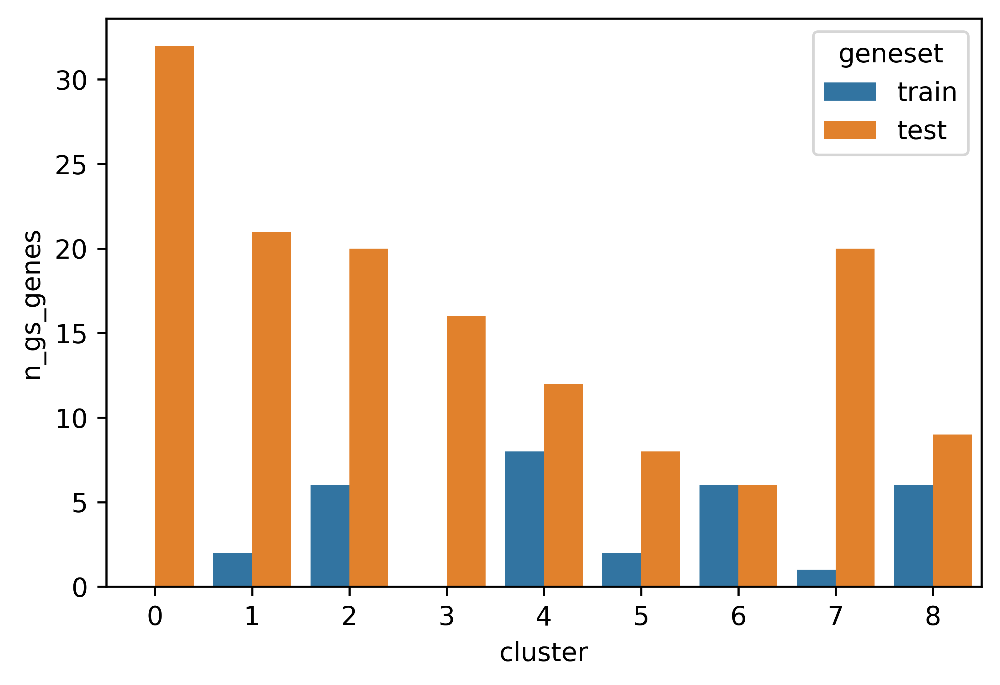

<IPython.core.display.Javascript object>

In [34]:
cluster_occ = {"cluster": [], "geneset": [], "n_gs_genes": [], "n_genes": []}
for cluster in np.unique(regulatory_emb_clusters):
    cluster_genes = set(
        regulatory_emb_clusters.loc[regulatory_emb_clusters == cluster].index
    )
    for geneset in ["train", "test"]:
        if geneset == "train":
            gs_genes = set(train_targets)
        elif geneset == "test":
            gs_genes = set(test_targets)
        cluster_occ["cluster"].append(cluster)
        cluster_occ["n_gs_genes"].append(len(gs_genes.intersection(cluster_genes)))
        cluster_occ["n_genes"].append(len(cluster_genes))
        cluster_occ["geneset"].append(geneset)

cluster_occ = pd.DataFrame(cluster_occ)
fig, ax = plt.subplots(figsize=[6, 4])
ax = sns.barplot(data=cluster_occ, x="cluster", y="n_gs_genes", hue="geneset")

The above plot shows that we have no training samples among the genes in cluster 0 and cluster 3. Additionally, we have only one training sample falling into cluster 7. As a consequence our learned map will likely never predict any gene embedding that is similar to the genes in these clusters. As a consequence we expect our map to not perform well in fact likely worse than expected by random chance on the task of predicting the OE conditions corresponding to gene targets falling into these clusters. We will thus evaluate the performance of our model individually for the samples falling into each cluster.

---

## Performance evaluation

Having read in the different candidates for the image-based gene perturbation embedding and the regulatory gene embeddings, we will now assess the translation performance.

### Sample performance

Before we run an extensive parameter gridsearch, we get a first idea of the translation performance for the different input morphological profiles and image embedding candidates using the model configuration that proved to be perform best on the Rohban data for the same chosen set of regulatory gene embeddings.

The performances will be compared against our two baselines namely a random baseline as well as the baseline that simply predicts the mean of the regulatory gene embeddings.

In [35]:
model_type = "mean_all"
model_params_dicts = [
    {"reg": 50},
]
n_neighbors_weights_features_params = [31]
n_weight_encodings_params = [5]
append_neighbor_embs_params = ["genes"]
neighbor_weight_encoding_params = ["gauss"]
rff_sigma_params = [10]
use_y_train_mean_params = [False]
use_y_mean_params = [True]

<IPython.core.display.Javascript object>

#### Mean embeddings and profiles

We start with using the embeddings and profiles averaged across all batches to obtain one embedding for each overexpression condition. We will now systematically assess the performance for all different corresponding gene perturbation embedding candidates.

In [36]:
use_batch_labels_params = [False]

<IPython.core.display.Javascript object>

##### Morphological profiles

In [37]:
pert_embs = embedding_dict["mean_jump_img_embs"]

<IPython.core.display.Javascript object>

In [38]:
m_morph_s_knn_hit_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    raw_reg_embs=raw_regulatory_embs,
    model_type=model_type,
    model_params_dicts=model_params_dicts,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    rff_sigma_params=rff_sigma_params,
    use_batch_labels_params=use_batch_labels_params,
    batch_labels=None,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_sample/mean_morph.pkl",
)

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

  0%|          | 0/1 [00:00<?, ?it/s]

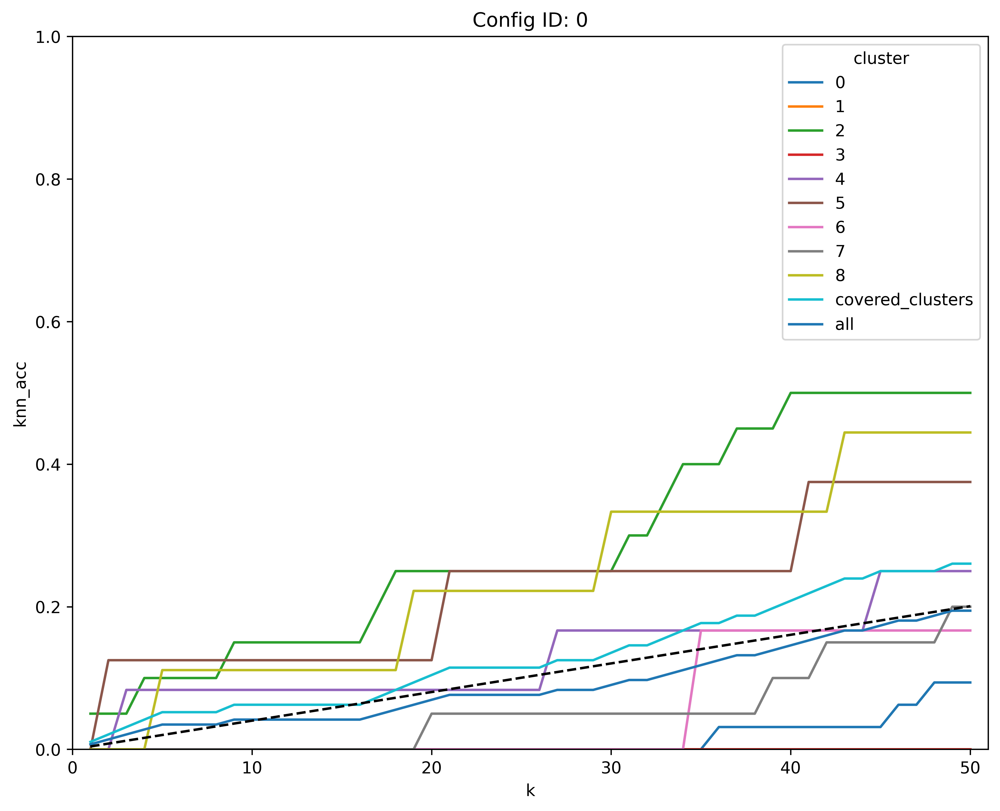

<IPython.core.display.Javascript object>

In [39]:
m_morph_s_knn_acc_results = get_knn_accs_for_config_ids(
    perf_data=m_morph_s_knn_hit_data,
    cluster_data=regulatory_emb_clusters,
    max_k=51,
)
plot_sample_knn_acc_results(m_morph_s_knn_acc_results)

---

##### Batch-centered morphological profiles

In [40]:
pert_embs = embedding_dict["mean_jump_morph_profiles_bc"]

<IPython.core.display.Javascript object>

In [41]:
m_morph_bc_s_knn_hit_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    model_type=model_type,
    model_params_dicts=model_params_dicts,
    raw_reg_embs=raw_regulatory_embs,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    rff_sigma_params=rff_sigma_params,
    use_batch_labels_params=use_batch_labels_params,
    batch_labels=None,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_sample/mean_morph_bc.pkl",
)

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

  0%|          | 0/1 [00:00<?, ?it/s]

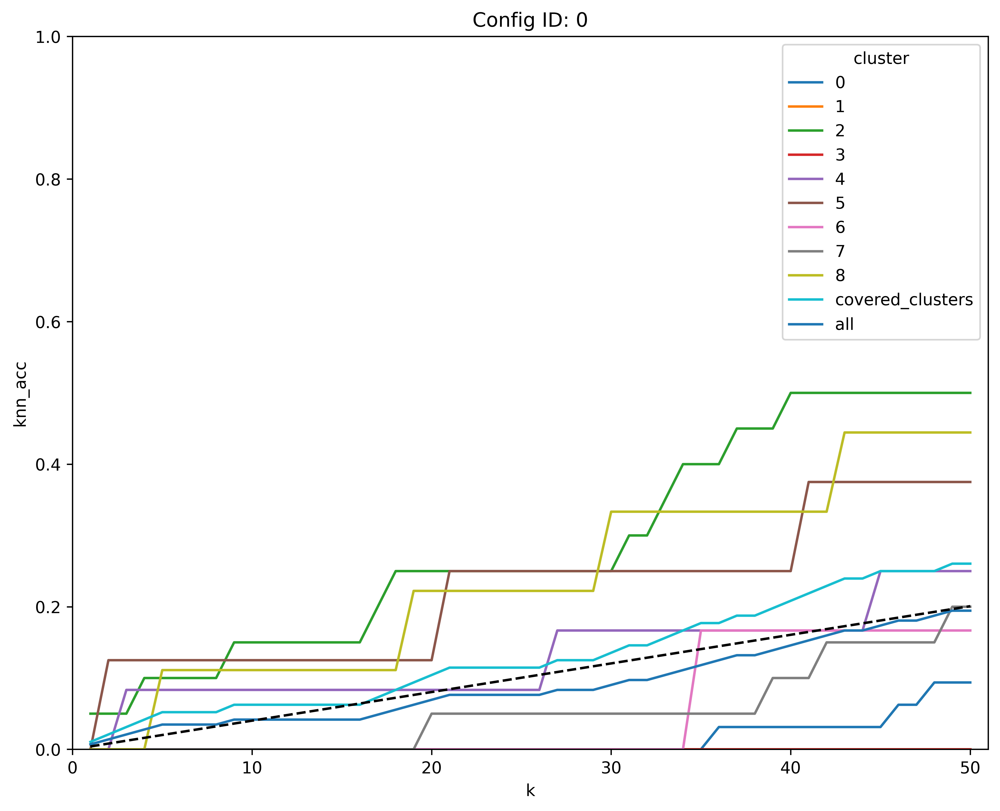

<IPython.core.display.Javascript object>

In [42]:
m_morph_bc_s_knn_acc_results = get_knn_accs_for_config_ids(
    perf_data=m_morph_bc_s_knn_hit_data,
    cluster_data=regulatory_emb_clusters,
    max_k=51,
)

plot_sample_knn_acc_results(m_morph_bc_s_knn_acc_results)

---

##### INSP-corrected morphological profiles


In [43]:
pert_embs = embedding_dict["mean_jump_morph_profiles_insp"]

<IPython.core.display.Javascript object>

In [44]:
m_morph_insp_s_knn_hit_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    model_type=model_type,
    model_params_dicts=model_params_dicts,
    raw_reg_embs=raw_regulatory_embs,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    rff_sigma_params=rff_sigma_params,
    use_batch_labels_params=use_batch_labels_params,
    batch_labels=None,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_sample/mean_morph_insp.pkl",
)

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

  0%|          | 0/1 [00:00<?, ?it/s]

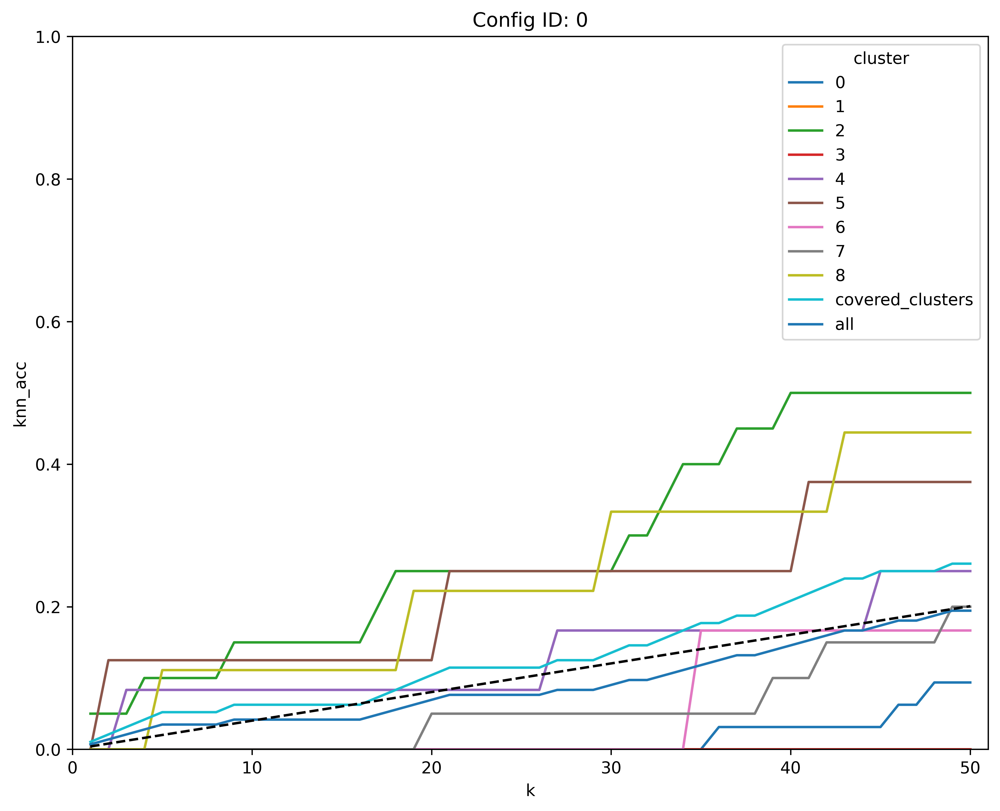

<IPython.core.display.Javascript object>

In [45]:
m_morph_insp_s_knn_acc_results = get_knn_accs_for_config_ids(
    perf_data=m_morph_insp_s_knn_hit_data,
    cluster_data=regulatory_emb_clusters,
    max_k=51,
)

plot_sample_knn_acc_results(m_morph_insp_s_knn_acc_results)

---

##### Image embeddings

In [46]:
pert_embs = embedding_dict["mean_jump_img_embs"]

<IPython.core.display.Javascript object>

In [47]:
m_img_embs_s_knn_hit_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    model_type=model_type,
    model_params_dicts=model_params_dicts,
    raw_reg_embs=raw_regulatory_embs,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    rff_sigma_params=rff_sigma_params,
    use_batch_labels_params=use_batch_labels_params,
    batch_labels=None,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_sample/mean_img_embs.pkl",
)

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

  0%|          | 0/1 [00:00<?, ?it/s]

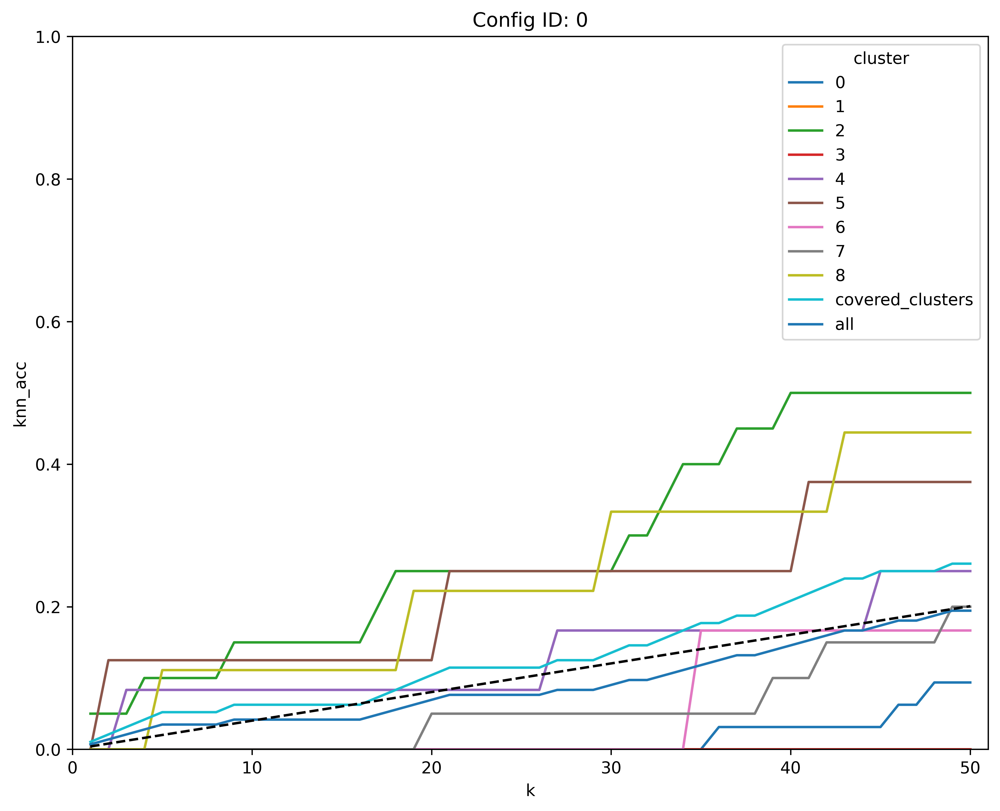

<IPython.core.display.Javascript object>

In [48]:
m_img_embs_s_knn_acc_results = get_knn_accs_for_config_ids(
    perf_data=m_img_embs_s_knn_hit_data,
    cluster_data=regulatory_emb_clusters,
    max_k=51,
)

plot_sample_knn_acc_results(m_img_embs_s_knn_acc_results)

----

##### Batch-centered image embeddings

In [49]:
pert_embs = embedding_dict["mean_jump_img_embs_bc"]

<IPython.core.display.Javascript object>

In [50]:
m_img_embs_bc_s_knn_hit_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    model_type=model_type,
    model_params_dicts=model_params_dicts,
    raw_reg_embs=raw_regulatory_embs,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    rff_sigma_params=rff_sigma_params,
    use_batch_labels_params=use_batch_labels_params,
    batch_labels=None,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_sample/mean_img_embs_bc.pkl",
)

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

  0%|          | 0/1 [00:00<?, ?it/s]

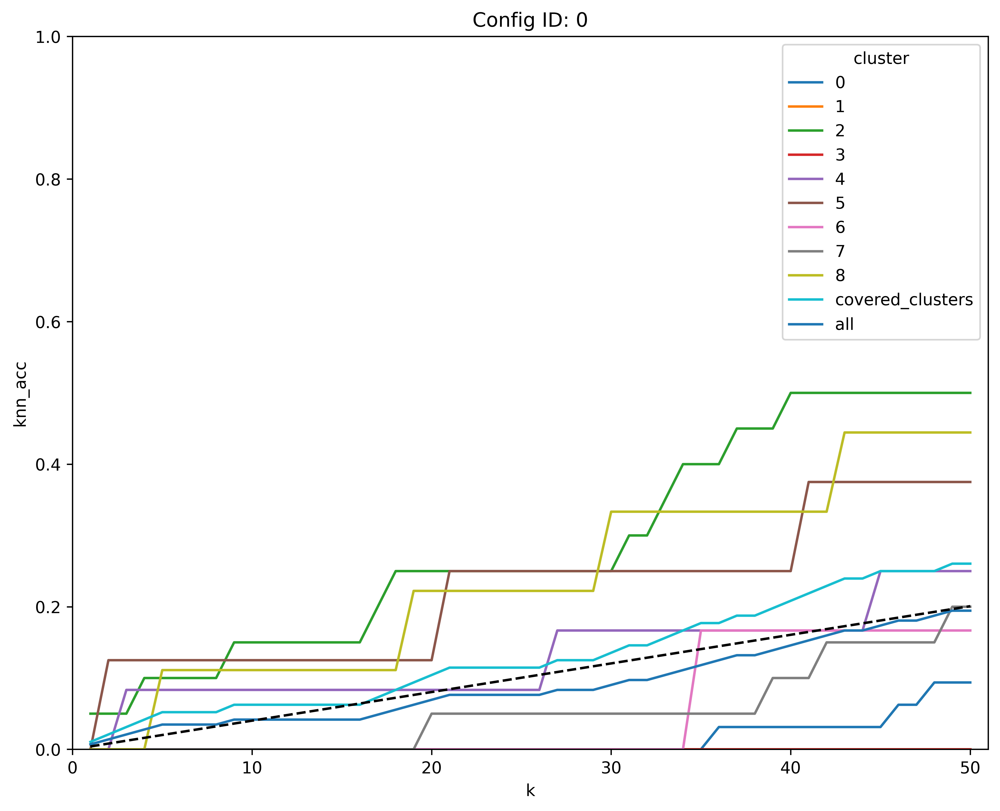

<IPython.core.display.Javascript object>

In [51]:
m_img_embs_bc_s_knn_acc_results = get_knn_accs_for_config_ids(
    perf_data=m_img_embs_bc_s_knn_hit_data,
    cluster_data=regulatory_emb_clusters,
    max_k=51,
)

plot_sample_knn_acc_results(m_img_embs_bc_s_knn_acc_results)

---

##### INSP-corrected image embeddings

In [52]:
pert_embs = embedding_dict["mean_jump_img_embs_insp"]

<IPython.core.display.Javascript object>

In [53]:
m_img_embs_insp_s_knn_hit_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    model_type=model_type,
    model_params_dicts=model_params_dicts,
    raw_reg_embs=raw_regulatory_embs,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    rff_sigma_params=rff_sigma_params,
    use_batch_labels_params=use_batch_labels_params,
    batch_labels=None,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_sample/mean_img_embs_insp.pkl",
)

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

  0%|          | 0/1 [00:00<?, ?it/s]

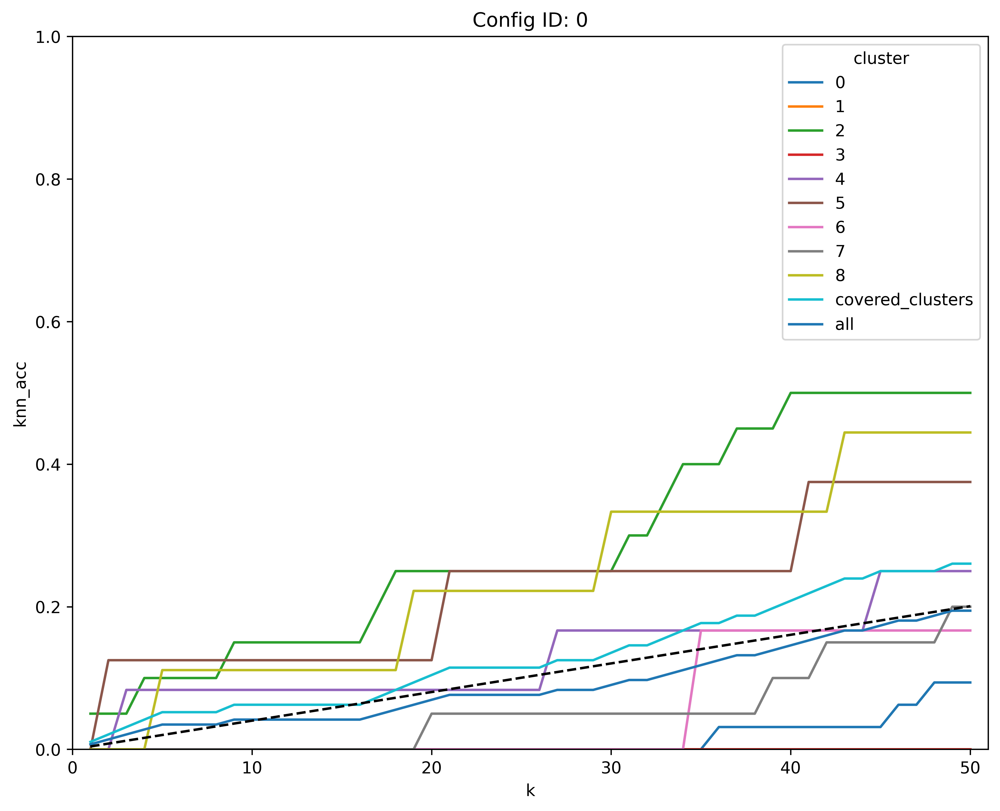

<IPython.core.display.Javascript object>

In [54]:
m_img_embs_insp_s_knn_acc_results = get_knn_accs_for_config_ids(
    perf_data=m_img_embs_insp_s_knn_hit_data,
    cluster_data=regulatory_emb_clusters,
    max_k=51,
)

plot_sample_knn_acc_results(m_img_embs_insp_s_knn_acc_results)

#### Batchwise mean embeddings and profiles

We also assess the sample performance using the different embeddings and profiles aggregated batch-wise, i.e. for each batch and condition we obtain the average of the corresponding embeddings as one sample input to our NTK map. Here in the following config_id=0 corresponds to not using the batch labels as an additional input feature whereas config_id=1 uses these.

In [55]:
use_batch_labels_params = [False, True]

<IPython.core.display.Javascript object>

##### Morphological profiles

In [56]:
pert_embs = embedding_dict["mean_batch_jump_morph_profiles"]
pert_embs.index = np.array(pert_embs.label)

<IPython.core.display.Javascript object>

In [57]:
mb_morph_s_knn_hit_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    model_type=model_type,
    model_params_dicts=model_params_dicts,
    raw_reg_embs=raw_regulatory_embs,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    rff_sigma_params=rff_sigma_params,
    use_batch_labels_params=use_batch_labels_params,
    batch_labels=pert_embs.batch,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_sample/mean_batch_morph.pkl",
)

  0%|          | 0/2 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

  0%|          | 0/2 [00:00<?, ?it/s]

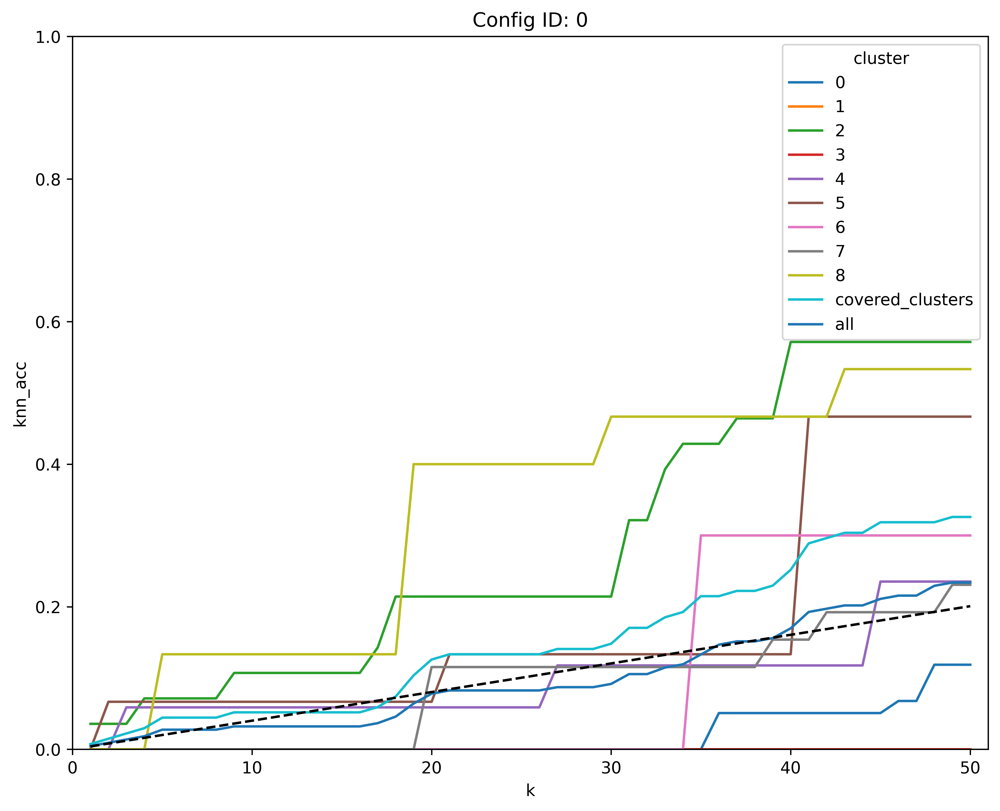

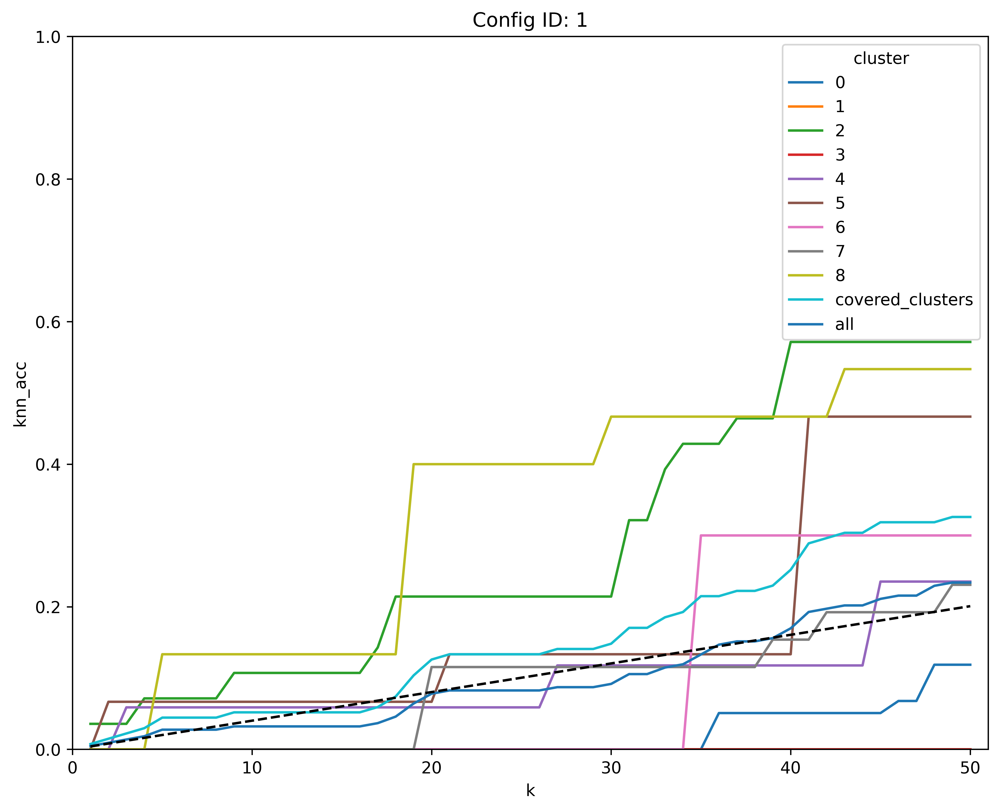

<IPython.core.display.Javascript object>

In [58]:
mb_morph_s_knn_acc_results = get_knn_accs_for_config_ids(
    perf_data=mb_morph_s_knn_hit_data,
    cluster_data=regulatory_emb_clusters,
    max_k=51,
)

plot_sample_knn_acc_results(mb_morph_s_knn_acc_results)

---

##### Batch-centered morphological profiles

In [59]:
pert_embs = embedding_dict["mean_batch_jump_morph_profiles_bc"]
pert_embs.index = np.array(pert_embs.label)

<IPython.core.display.Javascript object>

In [60]:
mb_morph_bc_s_knn_hit_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    model_type=model_type,
    model_params_dicts=model_params_dicts,
    raw_reg_embs=raw_regulatory_embs,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    rff_sigma_params=rff_sigma_params,
    use_batch_labels_params=use_batch_labels_params,
    batch_labels=pert_embs.batch,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_sample/mean_batch_morph_bc.pkl",
)

  0%|          | 0/2 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

  0%|          | 0/2 [00:00<?, ?it/s]

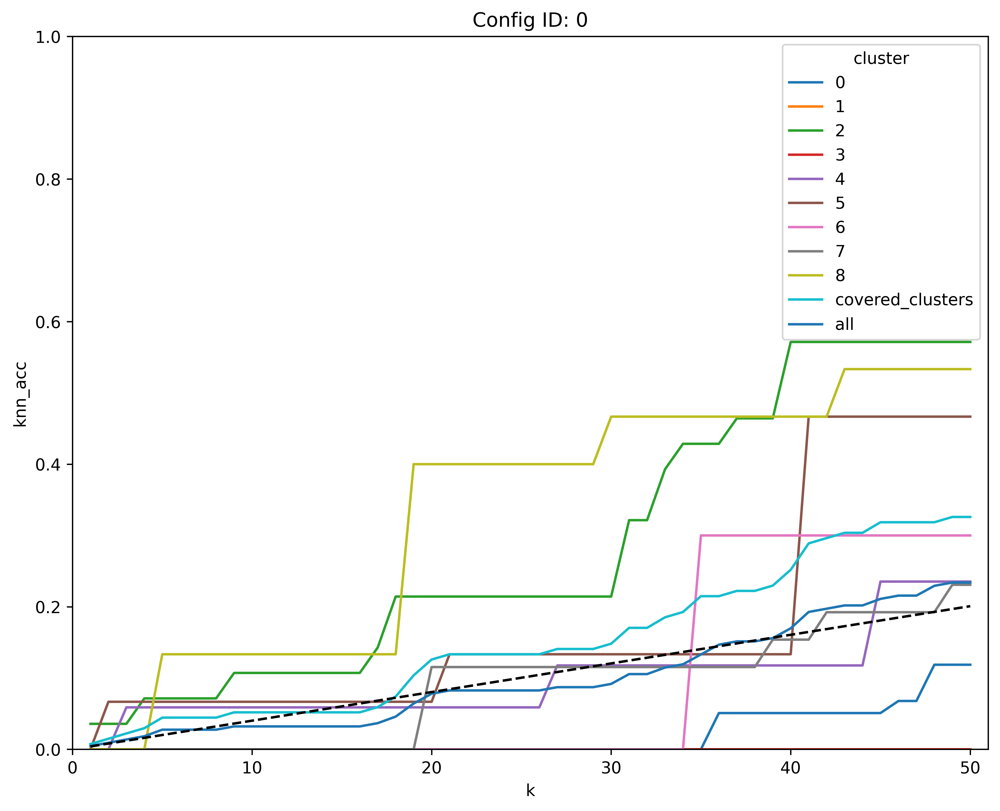

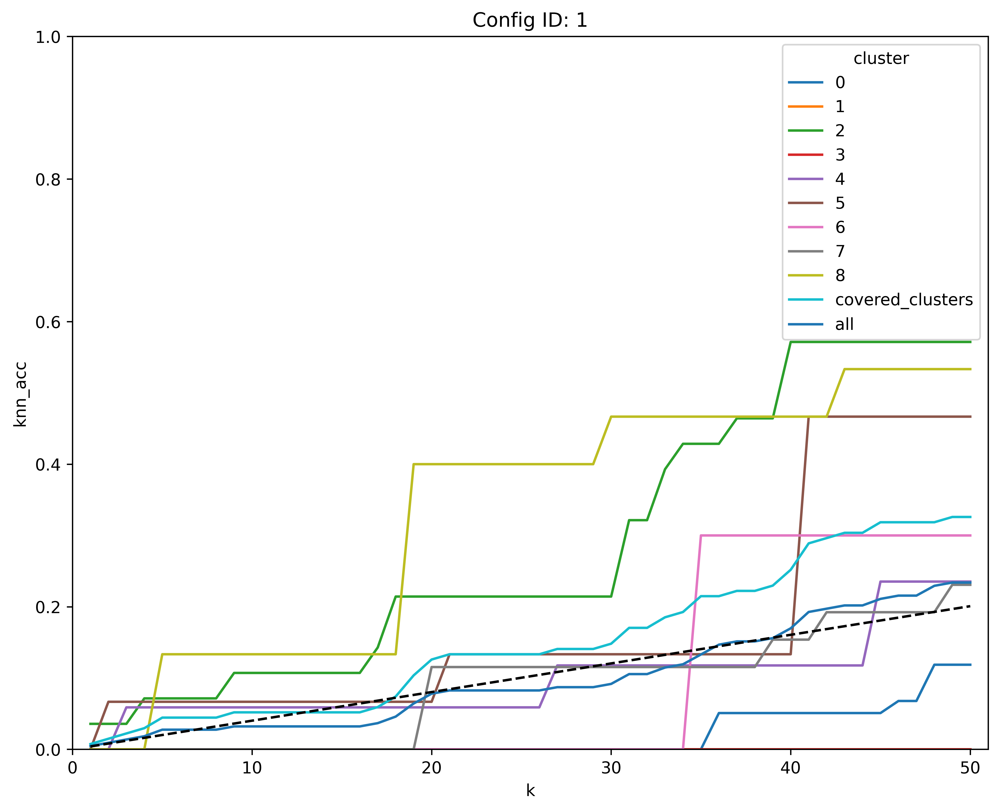

<IPython.core.display.Javascript object>

In [61]:
mb_morph_bc_s_knn_acc_results = get_knn_accs_for_config_ids(
    perf_data=mb_morph_bc_s_knn_hit_data,
    cluster_data=regulatory_emb_clusters,
    max_k=51,
)

plot_sample_knn_acc_results(mb_morph_bc_s_knn_acc_results)

---

##### INSP-corrected morphological profiles


In [62]:
pert_embs = embedding_dict["mean_batch_jump_morph_profiles_insp"]
pert_embs.index = np.array(pert_embs.label)

<IPython.core.display.Javascript object>

In [63]:
mb_morph_insp_s_knn_hit_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    model_type=model_type,
    model_params_dicts=model_params_dicts,
    raw_reg_embs=raw_regulatory_embs,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    rff_sigma_params=rff_sigma_params,
    use_batch_labels_params=use_batch_labels_params,
    batch_labels=pert_embs.batch,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_sample/mean_batch_morph_insp.pkl",
)

  0%|          | 0/2 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

  0%|          | 0/2 [00:00<?, ?it/s]

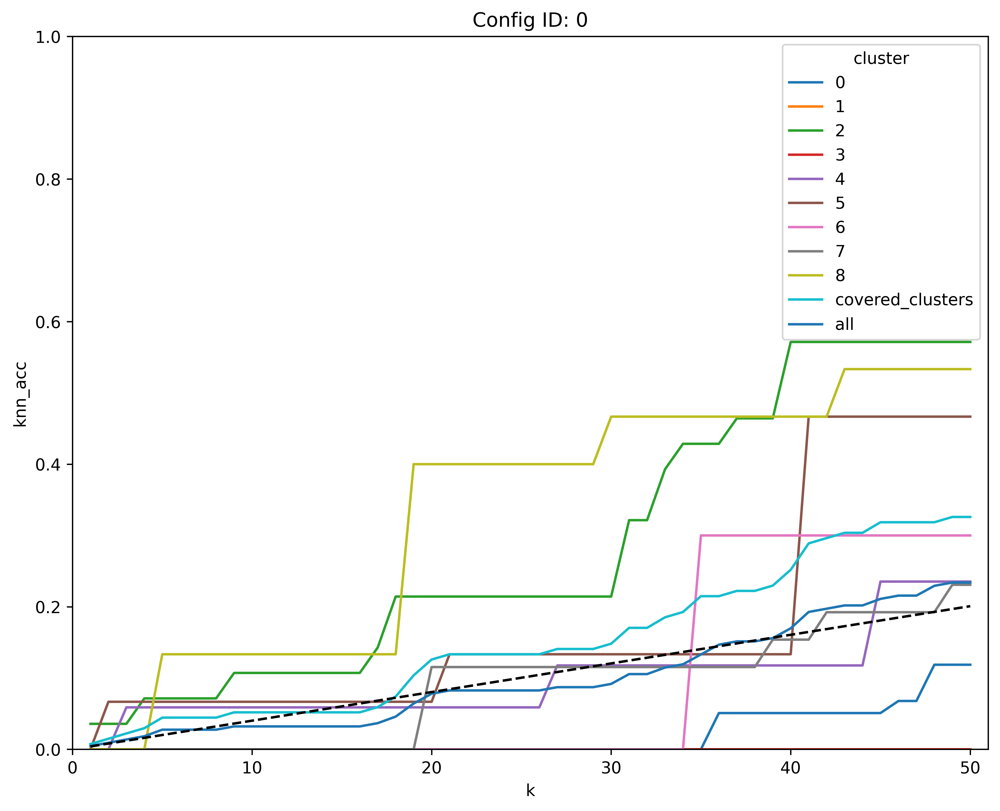

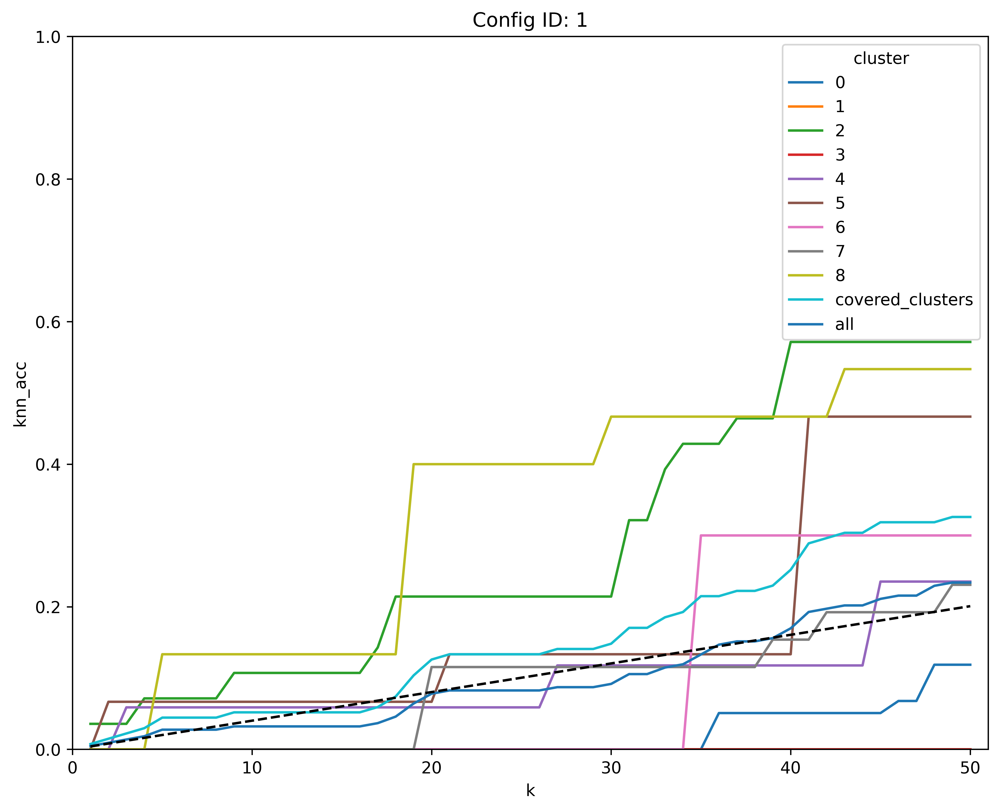

<IPython.core.display.Javascript object>

In [64]:
mb_morph_insp_s_knn_acc_results = get_knn_accs_for_config_ids(
    perf_data=mb_morph_insp_s_knn_hit_data,
    cluster_data=regulatory_emb_clusters,
    max_k=51,
)

plot_sample_knn_acc_results(mb_morph_insp_s_knn_acc_results)

---

##### Image embeddings

In [65]:
model_type = "mean_all"
model_params_dicts = [
    {"reg": 0},
]
n_neighbors_weights_features_params = [0]
n_weight_encodings_params = [5]
append_neighbor_embs_params = [None]
neighbor_weight_encoding_params = ["gauss"]
rff_sigma_params = [10]
use_y_train_mean_params = [False]
use_y_mean_params = [False]
use_batch_labels_params = [False]

<IPython.core.display.Javascript object>

In [66]:
pert_embs = embedding_dict["mean_jump_img_embs"]
pert_embs.index = np.array(pert_embs.label)

<IPython.core.display.Javascript object>

In [67]:
mb_img_embs_s_knn_hit_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    model_type=model_type,
    model_params_dicts=model_params_dicts,
    raw_reg_embs=raw_regulatory_embs,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    rff_sigma_params=rff_sigma_params,
    use_batch_labels_params=use_batch_labels_params,
    # batch_labels=pert_embs.batch,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_sample/mean_batch_img_embs.pkl",
)

  0%|          | 0/1 [00:00<?, ?it/s]

<ipython-input-18-d1671a570f0b>:121: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block2_values] [items->Index(['model', 'pos_encoding_type', 'append_neighbor_embs'], dtype='object')]

  all_knn_hit_results.to_hdf(save_output_file, key="data")


<IPython.core.display.Javascript object>

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

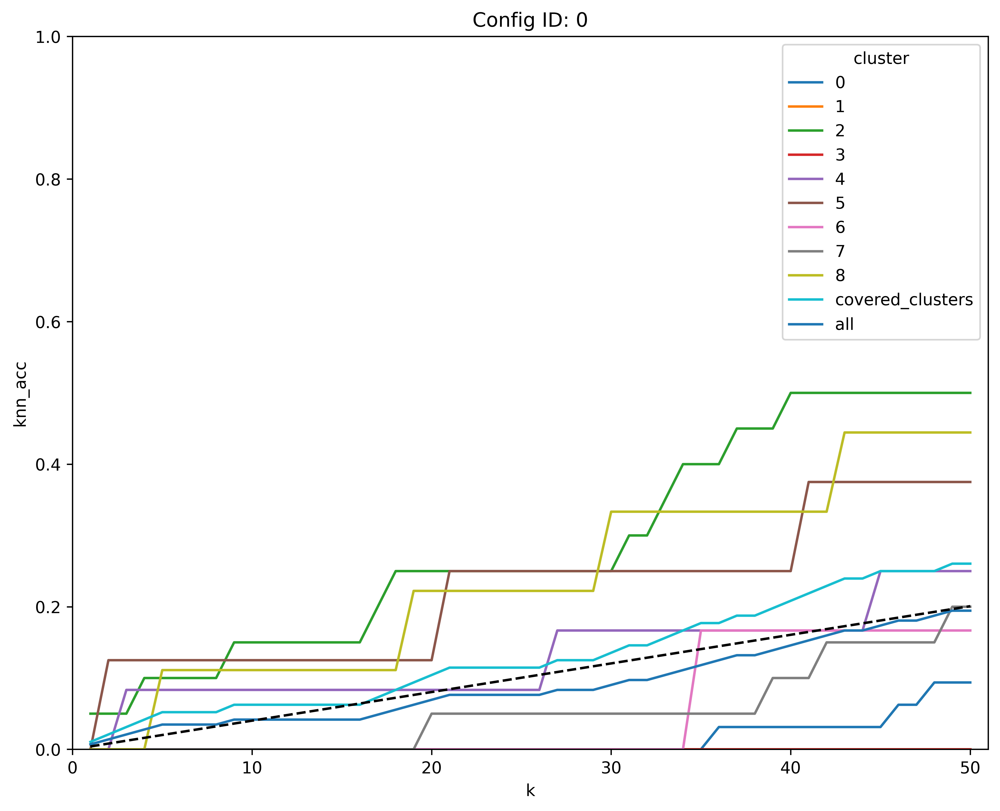

<IPython.core.display.Javascript object>

In [68]:
mb_img_embs_s_knn_acc_results = get_knn_accs_for_config_ids(
    perf_data=mb_img_embs_s_knn_hit_data,
    cluster_data=regulatory_emb_clusters,
    max_k=51,
)

mb_img_embs_s_knn_acc_results = add_cluster_aucs_for_knn_acc_results(
    mb_img_embs_s_knn_acc_results
)

plot_sample_knn_acc_results(mb_img_embs_s_knn_acc_results)

In [69]:
mb_img_embs_s_knn_acc_results.loc[
    mb_img_embs_s_knn_acc_results.cluster == "covered_clusters"
].groupby("config_id").mean(numeric_only=True).loc[
    :, ["10nn_auc", "20nn_auc", "30nn_auc", "40nn_auc", "50nn_auc"]
].sum(
    axis=1
)

config_id
0    0.415017
dtype: float64

<IPython.core.display.Javascript object>

----

##### Batch-centered image embeddings

In [70]:
pert_embs = embedding_dict["mean_batch_jump_img_embs_bc"]
pert_embs.index = np.array(pert_embs.label)

<IPython.core.display.Javascript object>

In [71]:
mb_img_embs_bc_s_knn_hit_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    model_type=model_type,
    model_params_dicts=model_params_dicts,
    raw_reg_embs=raw_regulatory_embs,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    rff_sigma_params=rff_sigma_params,
    use_batch_labels_params=use_batch_labels_params,
    batch_labels=pert_embs.batch,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_sample/mean_batch_img_embs_bc.pkl",
)

  0%|          | 0/1 [00:00<?, ?it/s]

<ipython-input-18-d1671a570f0b>:121: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block2_values] [items->Index(['model', 'pos_encoding_type', 'append_neighbor_embs'], dtype='object')]

  all_knn_hit_results.to_hdf(save_output_file, key="data")


<IPython.core.display.Javascript object>

  0%|          | 0/1 [00:00<?, ?it/s]

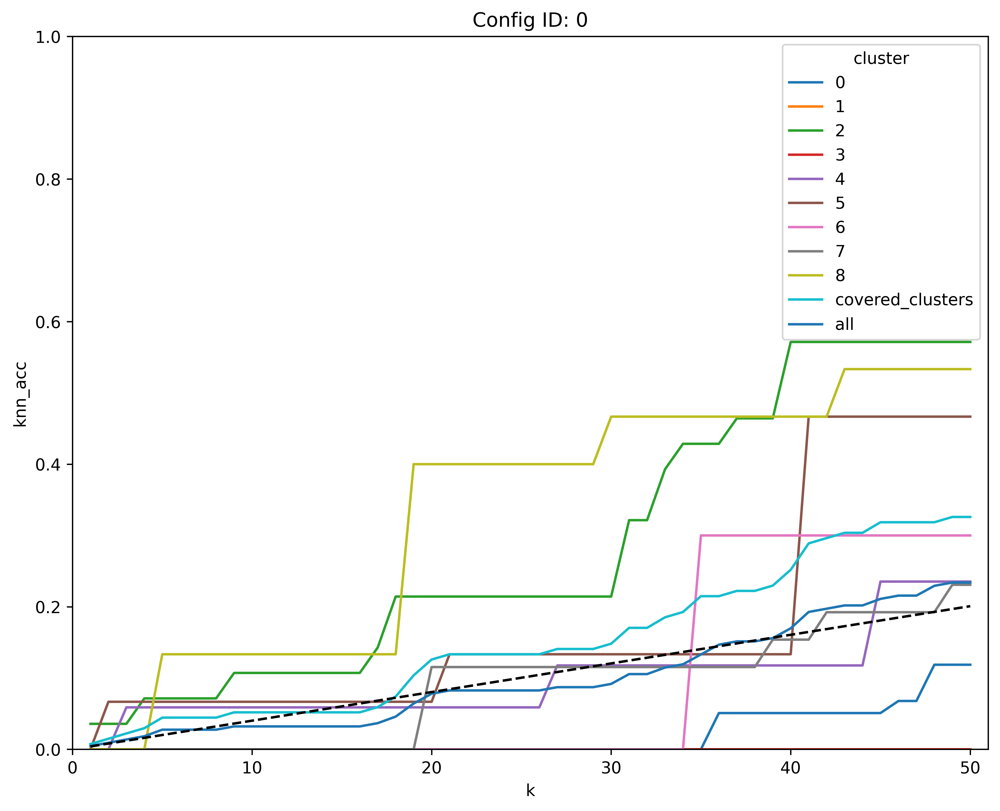

<IPython.core.display.Javascript object>

In [72]:
mb_img_embs_bc_s_knn_acc_results = get_knn_accs_for_config_ids(
    perf_data=mb_img_embs_bc_s_knn_hit_data,
    cluster_data=regulatory_emb_clusters,
    max_k=51,
)

plot_sample_knn_acc_results(mb_img_embs_bc_s_knn_acc_results)

---

##### INSP-corrected image embeddings

In [73]:
pert_embs = embedding_dict["mean_batch_jump_img_embs_insp"]
pert_embs.index = np.array(pert_embs.label)

<IPython.core.display.Javascript object>

In [74]:
mb_img_embs_insp_s_knn_hit_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    model_type=model_type,
    model_params_dicts=model_params_dicts,
    raw_reg_embs=raw_regulatory_embs,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    rff_sigma_params=rff_sigma_params,
    use_batch_labels_params=use_batch_labels_params,
    batch_labels=pert_embs.batch,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_sample/mean_batch_img_embs_insp.pkl",
)

  0%|          | 0/1 [00:00<?, ?it/s]

<ipython-input-18-d1671a570f0b>:121: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block2_values] [items->Index(['model', 'pos_encoding_type', 'append_neighbor_embs'], dtype='object')]

  all_knn_hit_results.to_hdf(save_output_file, key="data")


<IPython.core.display.Javascript object>

  0%|          | 0/1 [00:00<?, ?it/s]

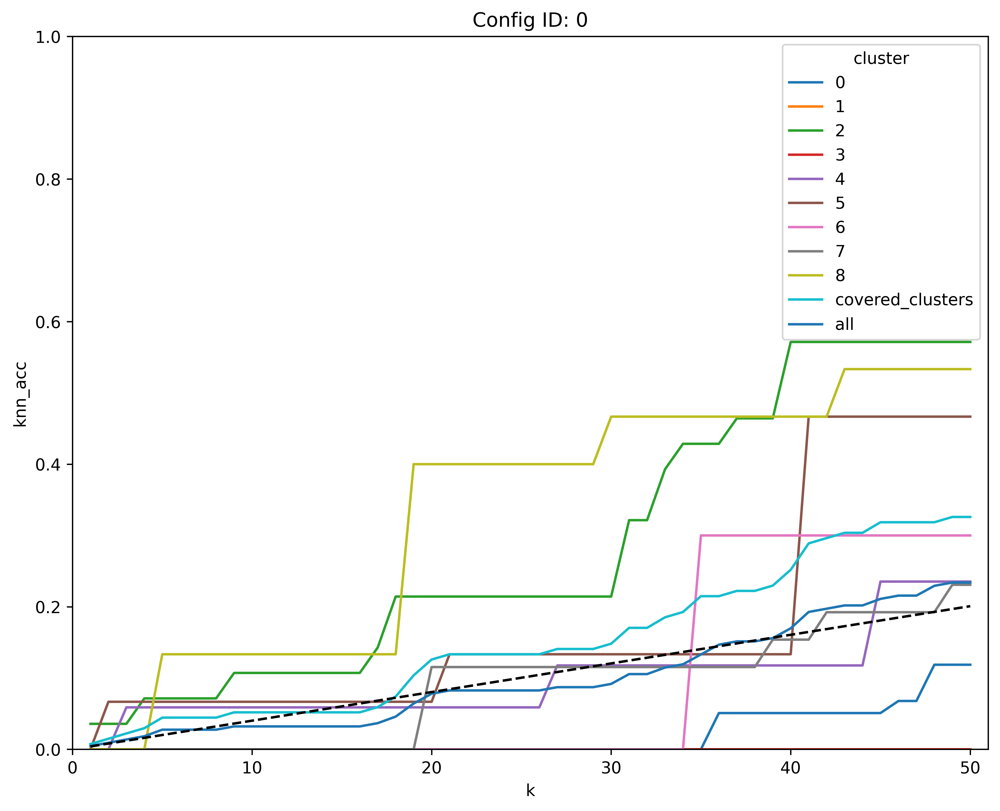

<IPython.core.display.Javascript object>

In [75]:
mb_img_embs_insp_s_knn_acc_results = get_knn_accs_for_config_ids(
    perf_data=mb_img_embs_insp_s_knn_hit_data,
    cluster_data=regulatory_emb_clusters,
    max_k=51,
)

plot_sample_knn_acc_results(mb_img_embs_insp_s_knn_acc_results)

---

### Gridsearch performance

After seeing that the sample performance does not yet give us the desired advantage for any NTK setup over the mean and random baseline, we will run an extensive parameter gridsearch to identify for each candiate of gene perturbation embedding the optimal parameters and input freatures for the NTK map.

In [97]:
model_type = "ntk"
model_params_dicts = [
    {"reg": 0},
    {"reg": 1},
    {"reg": 5},
    {"reg": 10},
    {"reg": 50},
]


use_y_train_mean_params = [False]
use_y_mean_params = [True, False]
n_neighbors_weights_features_params = [0, 10, 31]
n_weight_encodings_params = [2, 5, 10, 20]
append_neighbor_embs_params = [None, "images", "genes"]
neighbor_weight_encoding_params = ["positional", "gauss"]
rff_sigma_params = [1, 5, 10]
normalize_prediction_params = [True, False]
normalize_inputs_params = [True, False]

<IPython.core.display.Javascript object>

---

#### Mean embeddings and profiles

In [77]:
use_batch_labels_params = [False]

<IPython.core.display.Javascript object>

---

##### Morphological profiles

In [99]:
pert_embs = embedding_dict["mean_jump_morph_profiles"]

<IPython.core.display.Javascript object>

In [100]:
m_morph_gs_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    model_type=model_type,
    model_params_dicts=model_params_dicts,
    raw_reg_embs=raw_regulatory_embs,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    rff_sigma_params=rff_sigma_params,
    normalize_prediction_params=normalize_prediction_params,
    normalize_inputs_params=normalize_inputs_params,
    use_batch_labels_params=use_batch_labels_params,
    batch_labels=None,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_gs/mean_morph.pkl",
)

  0%|          | 0/7680 [00:00<?, ?it/s]

<ipython-input-18-d1671a570f0b>:121: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block2_values] [items->Index(['model', 'pos_encoding_type', 'append_neighbor_embs'], dtype='object')]

  all_knn_hit_results.to_hdf(save_output_file, key="data")


<IPython.core.display.Javascript object>

In [80]:
# m_morph_gs_data = m_morph_gs_data.loc[
#     (m_morph_gs_data.n_neighbors_pos_encodings == 0)
#     | (m_morph_gs_data.n_neighbors_pos_encodings == 31)
#     | (m_morph_gs_data.append_neighbor_embs.notnull())
# ]

<IPython.core.display.Javascript object>

In [105]:
m_morph_gs_knn_accs = get_knn_accs_for_config_ids(
    m_morph_gs_data,
    regulatory_emb_clusters,
)
m_morph_gs_knn_accs = add_cluster_aucs_for_knn_acc_results(m_morph_gs_knn_accs)

  0%|          | 0/7680 [00:00<?, ?it/s]

  0%|          | 0/7680 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

While we have computed all metrics for all subset of targets, we will generally look at the data for the covered clusters.

In [119]:
cc_m_morph_gs_knn_accs = m_morph_gs_knn_accs.loc[
    m_morph_gs_knn_accs.cluster == "covered_clusters"
]

<IPython.core.display.Javascript object>

In [120]:
cc_m_morph_gs_knn_accs.groupby("config_id").mean(numeric_only=True).loc[
    :, ["10nn_auc", "20nn_auc", "30nn_auc", "40nn_auc", "50nn_auc"]
].sum(axis=1).sort_values(ascending=False).head(1)

config_id
467    0.45283
dtype: float64

<IPython.core.display.Javascript object>

In [108]:
output_best_model_config_ids(
    results=cc_m_morph_gs_knn_accs,
    metric_cols=["20nn_auc", "50nn_auc"],
    n_config_ids=2,
)

,config_id,metric,value


<IPython.core.display.Javascript object>

We find the best model for configuration with ID 139

In [121]:
m_morph_best_knn_acc_results = cc_m_morph_gs_knn_accs.loc[
    cc_m_morph_gs_knn_accs.config_id == 467
]

<IPython.core.display.Javascript object>

In [86]:
# m_morph_gs_data.loc[m_morph_gs_data.config_id == 2083].head(1)

<IPython.core.display.Javascript object>

---

##### Batch-centered morphological profiles

In [87]:
# pert_embs = embedding_dict["mean_jump_morph_profiles_bc"]

<IPython.core.display.Javascript object>

In [88]:
# m_morph_bc_gs_data = run_jump_gridsearch_knn_hits(
#     pert_embs=pert_embs._get_numeric_data(),
#     reg_embs=regulatory_embs,
#     train_targets=list(train_targets),
#     test_targets=list(test_targets),
#     model_type=model_type,
#     model_params_dicts=model_params_dicts,
#     use_y_train_mean_params=use_y_train_mean_params,
#     use_y_mean_params=use_y_mean_params,
#     n_neighbors_weights_features_params=n_neighbors_weights_features_params,
#     n_weight_encodings_params=n_weight_encodings_params,
#     append_neighbor_embs_params=append_neighbor_embs_params,
#     neighbor_weight_encoding_params=neighbor_weight_encoding_params,
#     rff_sigma_params=rff_sigma_params,
#     use_batch_labels_params=use_batch_labels_params,
#     batch_labels=None,
#     save_output_file="../../../../data/experiments/translation_results/jump/ntk_gs/mean_morph_bc.pkl",
# )

<IPython.core.display.Javascript object>

In [89]:
# m_morph_bc_gs_data = m_morph_bc_gs_data.loc[
#     (m_morph_bc_gs_data.n_neighbors_pos_encodings == 0)
#     | (m_morph_bc_gs_data.n_neighbors_pos_encodings == 31)
#     | (m_morph_bc_gs_data.append_neighbor_embs.notnull())
# ]

<IPython.core.display.Javascript object>

In [90]:
# m_morph_bc_gs_knn_accs = get_knn_accs_for_config_ids(
#     m_morph_bc_gs_data,
#     regulatory_emb_clusters,
# )
# m_morph_bc_gs_knn_accs = add_cluster_aucs_for_knn_acc_results(
#     m_morph_bc_gs_knn_accs
# )

<IPython.core.display.Javascript object>

While we have computed all metrics for all subset of targets, we will generally look at the data for the covered clusters.

In [91]:
# cc_m_morph_bc_gs_knn_accs = m_morph_bc_gs_knn_accs.loc[
#     m_morph_bc_gs_knn_accs.cluster == "covered_clusters"
# ]

<IPython.core.display.Javascript object>

In [92]:
# output_best_model_config_ids(
#     results=cc_m_morph_bc_gs_knn_accs,
#     metric_cols=["20nn_auc", "50nn_auc"],
#     n_config_ids=53,
# )

<IPython.core.display.Javascript object>

We find the best model for configuration with ID 139

In [93]:
# m_morph_bc_best_knn_acc_results = cc_m_morph_bc_gs_knn_accs.loc[
#     cc_m_morph_bc_gs_knn_accs.config_id == 1718
# ]

<IPython.core.display.Javascript object>

In [94]:
# m_morph_bc_gs_data.loc[m_morph_bc_gs_data.config_id == 1718].head(1)

<IPython.core.display.Javascript object>

---

##### Image-embeddings

In [95]:
pert_embs = embedding_dict["mean_jump_img_embs"]

<IPython.core.display.Javascript object>

In [98]:
m_img_embs_gs_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    model_type=model_type,
    raw_reg_embs=raw_regulatory_embs,
    model_params_dicts=model_params_dicts,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    normalize_prediction_params=normalize_prediction_params,
    normalize_inputs_params=normalize_inputs_params,
    rff_sigma_params=rff_sigma_params,
    use_batch_labels_params=use_batch_labels_params,
    batch_labels=None,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_gs/mean_img_embs.pkl",
)

  0%|          | 0/7680 [00:00<?, ?it/s]

<ipython-input-18-d1671a570f0b>:121: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block2_values] [items->Index(['model', 'pos_encoding_type', 'append_neighbor_embs'], dtype='object')]

  all_knn_hit_results.to_hdf(save_output_file, key="data")


<IPython.core.display.Javascript object>

In [101]:
# m_img_embs_gs_data = m_img_embs_gs_data.loc[
#     (m_img_embs_gs_data.n_neighbors_pos_encodings == 0)
#     | (m_img_embs_gs_data.n_neighbors_pos_encodings == 31)
#     | (m_img_embs_gs_data.append_neighbor_embs.notnull())
# ]

<IPython.core.display.Javascript object>

In [101]:
m_img_gs_knn_accs = get_knn_accs_for_config_ids(
    m_img_embs_gs_data,
    regulatory_emb_clusters,
)
m_img_gs_knn_accs = add_cluster_aucs_for_knn_acc_results(m_img_gs_knn_accs)

  0%|          | 0/7680 [00:00<?, ?it/s]

  0%|          | 0/7680 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

In [102]:
cc_m_img_gs_knn_accs = m_img_gs_knn_accs.loc[
    m_img_gs_knn_accs.cluster == "covered_clusters"
]

<IPython.core.display.Javascript object>

In [103]:
cc_m_img_gs_knn_accs.groupby("config_id").mean(numeric_only=True).loc[
    :, ["10nn_auc", "20nn_auc", "30nn_auc", "40nn_auc", "50nn_auc"]
].sum(axis=1).sort_values(ascending=False).head(1)

config_id
4557    0.470399
dtype: float64

<IPython.core.display.Javascript object>

In [151]:
output_best_model_config_ids(
    results=cc_m_img_gs_knn_accs,
    metric_cols=["20nn_auc", "50nn_auc"],
    n_config_ids=20,
)

,config_id,metric,value
14,5317,20nn_auc,0.071354
30,5317,50nn_auc,0.142292


<IPython.core.display.Javascript object>

We find the best model for configuration with ID 562.

In [155]:
m_img_best_knn_acc_results = cc_m_img_gs_knn_accs.loc[
    cc_m_img_gs_knn_accs.config_id == 4557
]

<IPython.core.display.Javascript object>

In [156]:
m_img_best_knn_acc_results

,config_id,cluster,genes,knn_hits,k,knn_acc,10nn_auc,20nn_auc,30nn_auc,40nn_auc,50nn_auc
2506800,4557,covered_clusters,"[CLSPN, MAGEA4, KPNA2, CDCA3, CDK14, CCNA2, MY...","[188, 180, 131, 92, 12, 138, 110, 231, 16, 130...",1,0.000000,0.022917,0.063542,0.101389,0.129427,0.153125
2506801,4557,covered_clusters,"[CLSPN, MAGEA4, KPNA2, CDCA3, CDK14, CCNA2, MY...","[188, 180, 131, 92, 12, 138, 110, 231, 16, 130...",2,0.010417,0.022917,0.063542,0.101389,0.129427,0.153125
2506802,4557,covered_clusters,"[CLSPN, MAGEA4, KPNA2, CDCA3, CDK14, CCNA2, MY...","[188, 180, 131, 92, 12, 138, 110, 231, 16, 130...",3,0.010417,0.022917,0.063542,0.101389,0.129427,0.153125
2506803,4557,covered_clusters,"[CLSPN, MAGEA4, KPNA2, CDCA3, CDK14, CCNA2, MY...","[188, 180, 131, 92, 12, 138, 110, 231, 16, 130...",4,0.010417,0.022917,0.063542,0.101389,0.129427,0.153125
2506804,4557,covered_clusters,"[CLSPN, MAGEA4, KPNA2, CDCA3, CDK14, CCNA2, MY...","[188, 180, 131, 92, 12, 138, 110, 231, 16, 130...",5,0.010417,0.022917,0.063542,0.101389,0.129427,0.153125
2506805,4557,covered_clusters,"[CLSPN, MAGEA4, KPNA2, CDCA3, CDK14, CCNA2, MY...","[188, 180, 131, 92, 12, 138, 110, 231, 16, 130...",6,0.020833,0.022917,0.063542,0.101389,0.129427,0.153125
2506806,4557,covered_clusters,"[CLSPN, MAGEA4, KPNA2, CDCA3, CDK14, CCNA2, MY...","[188, 180, 131, 92, 12, 138, 110, 231, 16, 130...",7,0.031250,0.022917,0.063542,0.101389,0.129427,0.153125
2506807,4557,covered_clusters,"[CLSPN, MAGEA4, KPNA2, CDCA3, CDK14, CCNA2, MY...","[188, 180, 131, 92, 12, 138, 110, 231, 16, 130...",8,0.031250,0.022917,0.063542,0.101389,0.129427,0.153125
2506808,4557,covered_clusters,"[CLSPN, MAGEA4, KPNA2, CDCA3, CDK14, CCNA2, MY...","[188, 180, 131, 92, 12, 138, 110, 231, 16, 130...",9,0.052083,0.022917,0.063542,0.101389,0.129427,0.153125
2506809,4557,covered_clusters,"[CLSPN, MAGEA4, KPNA2, CDCA3, CDK14, CCNA2, MY...","[188, 180, 131, 92, 12, 138, 110, 231, 16, 130...",10,0.052083,0.022917,0.063542,0.101389,0.129427,0.153125


<IPython.core.display.Javascript object>

In [171]:
m_img_embs_gs_data.loc[m_img_embs_gs_data.config_id == 4557].sort_values(
    "knn_hit"
).head(20)

,knn_hit,model,reg,use_mean_train_reg_embs,use_mean_reg_embs,n_neighbors_pos_encodings,n_pos_encodings,pos_encoding_type,append_neighbor_embs,rff_sigma,use_batch_labels,normalize_inputs,normalize_prediction,config_id,cluster
CDK6,1,ntk,5,False,False,31,20,gauss,None,10,False,False,True,4557,8
LDOC1,5,ntk,5,False,False,31,20,gauss,None,10,False,False,True,4557,2
EFEMP1,6,ntk,5,False,False,31,20,gauss,None,10,False,False,True,4557,6
FEN1,8,ntk,5,False,False,31,20,gauss,None,10,False,False,True,4557,7
CCND2,8,ntk,5,False,False,31,20,gauss,None,10,False,False,True,4557,8
CD40,10,ntk,5,False,False,31,20,gauss,None,10,False,False,True,4557,6
SFN,11,ntk,5,False,False,31,20,gauss,None,10,False,False,True,4557,2
CDK14,12,ntk,5,False,False,31,20,gauss,None,10,False,False,True,4557,2
EEF1A2,14,ntk,5,False,False,31,20,gauss,None,10,False,False,True,4557,8
RARA,15,ntk,5,False,False,31,20,gauss,None,10,False,False,True,4557,5


<IPython.core.display.Javascript object>

---

##### INSP-corrected image-embeddings

In [ ]:
# pert_embs = embedding_dict["mean_jump_img_embs_insp"]

In [ ]:
# m_img_embs_insp_gs_data = run_jump_gridsearch_knn_hits(
#     pert_embs=pert_embs._get_numeric_data(),
#     reg_embs=regulatory_embs,
#     train_targets=list(train_targets),
#     test_targets=list(test_targets),
#     model_type=model_type,
#     model_params_dicts=model_params_dicts,
#     use_y_train_mean_params=use_y_train_mean_params,
#     use_y_mean_params=use_y_mean_params,
#     n_neighbors_weights_features_params=n_neighbors_weights_features_params,
#     n_weight_encodings_params=n_weight_encodings_params,
#     append_neighbor_embs_params=append_neighbor_embs_params,
#     neighbor_weight_encoding_params=neighbor_weight_encoding_params,
#     rff_sigma_params=rff_sigma_params,
#     use_batch_labels_params=use_batch_labels_params,
#     batch_labels=None,
#     save_output_file="../../../../data/experiments/translation_results/jump/ntk_gs/mean_img_embs_insp.pkl",
# )

In [ ]:
# m_img_embs_insp_gs_data = m_img_embs_insp_gs_data.loc[
#     (m_img_embs_insp_gs_data.n_neighbors_pos_encodings == 0)
#     | (m_img_embs_insp_gs_data.n_neighbors_pos_encodings == 31)
#     | (m_img_embs_insp_gs_data.append_neighbor_embs.notnull())
# ]

In [ ]:
# m_img_insp_gs_knn_accs = get_knn_accs_for_config_ids(
#     m_img_embs_insp_gs_data,
#     regulatory_emb_clusters,
# )
# m_img_insp_gs_knn_accs = add_cluster_aucs_for_knn_acc_results(
#     m_img_insp_gs_knn_accs
# )

In [ ]:
# cc_m_img_insp_gs_knn_accs = m_img_insp_gs_knn_accs.loc[
#     m_img_insp_gs_knn_accs.cluster == "covered_clusters"
# ]

In [ ]:
# output_best_model_config_ids(
#     results=cc_m_img_insp_gs_knn_accs,
#     metric_cols=["20nn_auc", "50nn_auc"],
#     n_config_ids=20,
# )

We find the best model for configuration with ID 562.

In [ ]:
# m_img_insp_best_knn_acc_results = cc_m_img_insp_gs_knn_accs.loc[
#     cc_m_img_insp_gs_knn_accs.config_id == 341
# ]

In [ ]:
# m_img_embs_insp_gs_data.loc[m_img_embs_insp_gs_data.config_id == 341].head(1)

---

#### Batchwise mean embedding and profiles

In [172]:
use_batch_labels_params = [False, True]

<IPython.core.display.Javascript object>

##### Morphological profiles

In [175]:
pert_embs = embedding_dict["mean_batch_jump_morph_profiles"]
pert_embs.index = np.array(pert_embs.label)

<IPython.core.display.Javascript object>

In [176]:
mb_morph_gs_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    model_type=model_type,
    model_params_dicts=model_params_dicts,
    raw_reg_embs=raw_regulatory_embs,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    rff_sigma_params=rff_sigma_params,
    normalize_prediction_params=normalize_prediction_params,
    normalize_inputs_params=normalize_inputs_params,
    use_batch_labels_params=use_batch_labels_params,
    batch_labels=pert_embs.batch,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_gs/mean_batch_morph.pkl",
)

  0%|          | 0/15360 [00:00<?, ?it/s]

<ipython-input-18-d1671a570f0b>:121: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block2_values] [items->Index(['model', 'pos_encoding_type', 'append_neighbor_embs'], dtype='object')]

  all_knn_hit_results.to_hdf(save_output_file, key="data")


<IPython.core.display.Javascript object>

In [ ]:
# mb_morph_gs_data = mb_morph_gs_data.loc[
#     (mb_morph_gs_data.n_neighbors_pos_encodings == 0)
#     | (mb_morph_gs_data.n_neighbors_pos_encodings == 31)
#     | (mb_morph_gs_data.append_neighbor_embs.notnull())
# ]

In [177]:
mb_morph_gs_knn_accs = get_knn_accs_for_config_ids(
    mb_morph_gs_data,
    regulatory_emb_clusters,
)
mb_morph_gs_knn_accs = add_cluster_aucs_for_knn_acc_results(mb_morph_gs_knn_accs)

  0%|          | 0/15360 [00:00<?, ?it/s]

  0%|          | 0/15360 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

In [180]:
cc_mb_morph_gs_knn_accs = mb_morph_gs_knn_accs.loc[
    mb_morph_gs_knn_accs.cluster == "covered_clusters"
]

<IPython.core.display.Javascript object>

In [182]:
cc_mb_morph_gs_knn_accs.groupby("config_id").mean(numeric_only=True).loc[
    :, ["10nn_auc", "20nn_auc", "30nn_auc", "40nn_auc", "50nn_auc"]
].sum(axis=1).sort_values(ascending=False).head(1)

config_id
8560    0.476049
dtype: float64

<IPython.core.display.Javascript object>

In [ ]:
# output_best_model_config_ids(
#     results=cc_mb_morph_gs_knn_accs,
#     metric_cols=["20nn_auc", "50nn_auc"],
#     n_config_ids=30,
# )

We find the best model for configuration with ID 3817.

In [184]:
mb_morph_best_knn_acc_results = cc_mb_morph_gs_knn_accs.loc[
    cc_mb_morph_gs_knn_accs.config_id == 8560
]

<IPython.core.display.Javascript object>

In [187]:
mb_morph_gs_data.loc[mb_morph_gs_data.config_id == 8560].head(1)

,knn_hit,model,reg,use_mean_train_reg_embs,use_mean_reg_embs,n_neighbors_pos_encodings,n_pos_encodings,pos_encoding_type,append_neighbor_embs,rff_sigma,use_batch_labels,normalize_inputs,normalize_prediction,config_id,cluster
RACGAP1,178,ntk,5,False,False,10,20,positional,images,10,False,True,True,8560,0


<IPython.core.display.Javascript object>

##### Batch-centered morphological profiles

In [ ]:
# pert_embs = embedding_dict["mean_batch_jump_morph_profiles_bc"]
# pert_embs.index = np.array(pert_embs.label)

In [ ]:
# mb_morph_bc_gs_data = run_jump_gridsearch_knn_hits(
#     pert_embs=pert_embs._get_numeric_data(),
#     reg_embs=regulatory_embs,
#     train_targets=list(train_targets),
#     test_targets=list(test_targets),
#     model_type=model_type,
#     model_params_dicts=model_params_dicts,
#     use_y_train_mean_params=use_y_train_mean_params,
#     use_y_mean_params=use_y_mean_params,
#     n_neighbors_weights_features_params=n_neighbors_weights_features_params,
#     n_weight_encodings_params=n_weight_encodings_params,
#     append_neighbor_embs_params=append_neighbor_embs_params,
#     neighbor_weight_encoding_params=neighbor_weight_encoding_params,
#     rff_sigma_params=rff_sigma_params,
#     use_batch_labels_params=use_batch_labels_params,
#     batch_labels=pert_embs.batch,
#     save_output_file="../../../../data/experiments/translation_results/jump/ntk_gs/mean_batch_morph_bc.pkl",
# )

In [ ]:
# mb_morph_bc_gs_data = mb_morph_bc_gs_data.loc[
#     (mb_morph_bc_gs_data.n_neighbors_pos_encodings == 0)
#     | (mb_morph_bc_gs_data.n_neighbors_pos_encodings == 31)
#     | (mb_morph_bc_gs_data.append_neighbor_embs.notnull())
# ]

In [ ]:
# mb_morph_gs_knn_accs = get_knn_accs_for_config_ids(
#     mb_morph_bc_gs_data,
#     regulatory_emb_clusters,
# )
# mb_morph_gs_knn_accs = add_cluster_aucs_for_knn_acc_results(
#     mb_morph_gs_knn_accs
# )

In [ ]:
# cc_mb_morph_gs_knn_accs = mb_morph_gs_knn_accs.loc[
#     mb_morph_gs_knn_accs.cluster == "covered_clusters"
# ]

In [ ]:
# output_best_model_config_ids(
#     results=cc_mb_morph_gs_knn_accs,
#     metric_cols=["20nn_auc", "50nn_auc"],
#     n_config_ids=30,
# )

We find the best model for configuration with ID 3817.

In [ ]:
# mb_morph_best_knn_acc_results = cc_mb_morph_gs_knn_accs.loc[
#     cc_mb_morph_gs_knn_accs.config_id == 3817
# ]

----

##### Image embeddings

In [173]:
pert_embs = embedding_dict["mean_batch_jump_img_embs"]
pert_embs.index = np.array(pert_embs.label)

<IPython.core.display.Javascript object>

In [174]:
mb_img_embs_gs_data = run_jump_gridsearch_knn_hits(
    pert_embs=pert_embs._get_numeric_data(),
    reg_embs=regulatory_embs,
    train_targets=list(train_targets),
    test_targets=list(test_targets),
    model_type=model_type,
    model_params_dicts=model_params_dicts,
    raw_reg_embs=raw_regulatory_embs,
    use_y_train_mean_params=use_y_train_mean_params,
    use_y_mean_params=use_y_mean_params,
    n_neighbors_weights_features_params=n_neighbors_weights_features_params,
    n_weight_encodings_params=n_weight_encodings_params,
    append_neighbor_embs_params=append_neighbor_embs_params,
    neighbor_weight_encoding_params=neighbor_weight_encoding_params,
    rff_sigma_params=rff_sigma_params,
    normalize_prediction_params=normalize_prediction_params,
    normalize_inputs_params=normalize_inputs_params,
    use_batch_labels_params=use_batch_labels_params,
    batch_labels=pert_embs.batch,
    save_output_file="../../../../data/experiments/translation_results/jump/ntk_gs/mean_batch_img_embs.pkl",
)

  0%|          | 0/15360 [00:00<?, ?it/s]

<ipython-input-18-d1671a570f0b>:121: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block2_values] [items->Index(['model', 'pos_encoding_type', 'append_neighbor_embs'], dtype='object')]

  all_knn_hit_results.to_hdf(save_output_file, key="data")


<IPython.core.display.Javascript object>

In [ ]:
# mb_img_embs_gs_data = mb_img_embs_gs_data.loc[
#     (mb_img_embs_gs_data.n_neighbors_pos_encodings == 0)
#     | (mb_img_embs_gs_data.n_neighbors_pos_encodings == 31)
#     | (mb_img_embs_gs_data.append_neighbor_embs.notnull())
# ]

In [188]:
mb_img_gs_knn_accs = get_knn_accs_for_config_ids(
    mb_img_embs_gs_data,
    regulatory_emb_clusters,
)
mb_img_gs_knn_accs = add_cluster_aucs_for_knn_acc_results(mb_img_gs_knn_accs)

  0%|          | 0/15360 [00:00<?, ?it/s]

  0%|          | 0/15360 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

In [191]:
cc_mb_img_gs_knn_accs = mb_img_gs_knn_accs.loc[
    mb_img_gs_knn_accs.cluster == "covered_clusters"
]

<IPython.core.display.Javascript object>

In [192]:
cc_mb_img_gs_knn_accs.groupby("config_id").mean(numeric_only=True).loc[
    :, ["10nn_auc", "20nn_auc", "30nn_auc", "40nn_auc", "50nn_auc"]
].sum(axis=1).sort_values(ascending=False).head(1)

config_id
12286    0.626395
dtype: float64

<IPython.core.display.Javascript object>

In [ ]:
# output_best_model_config_ids(
#     results=cc_mb_img_gs_knn_accs,
#     metric_cols=["20nn_auc", "50nn_auc"],
#     n_config_ids=103,
# )

In [194]:
mb_img_best_knn_acc_results = cc_mb_img_gs_knn_accs.loc[
    cc_mb_img_gs_knn_accs.config_id == 12286
]

<IPython.core.display.Javascript object>

In [283]:
mb_img_embs_gs_data.loc[mb_img_embs_gs_data.config_id == 12286].head()

,knn_hit,model,reg,use_mean_train_reg_embs,use_mean_reg_embs,n_neighbors_pos_encodings,n_pos_encodings,pos_encoding_type,append_neighbor_embs,rff_sigma,use_batch_labels,normalize_inputs,normalize_prediction,config_id,cluster
RACGAP1,235,ntk,10,False,False,31,20,gauss,genes,10,True,True,False,12286,0
RACGAP1,208,ntk,10,False,False,31,20,gauss,genes,10,True,True,False,12286,0
CLSPN,131,ntk,10,False,False,31,20,gauss,genes,10,True,True,False,12286,7
PLK1,146,ntk,10,False,False,31,20,gauss,genes,10,True,True,False,12286,0
PLK1,155,ntk,10,False,False,31,20,gauss,genes,10,True,True,False,12286,0


<IPython.core.display.Javascript object>

---

### Baselines

#### Random baseline

In [124]:
pert_embs = embedding_dict["mean_jump_img_embs"]

<IPython.core.display.Javascript object>

In [125]:
all_random_knn_hit_data = []
for b in tqdm(range(100)):
    random_knn_hit_data = get_jump_knn_hit_data(
        get_jump_random_nn_prediction_dict(
            pert_embs, regulatory_embs, train_targets, test_targets, random_state=1234
        ),
    )
    random_knn_hit_data["config_id"] = b
    all_random_knn_hit_data.append(random_knn_hit_data)
all_random_knn_hit_data = pd.concat(all_random_knn_hit_data)

  0%|          | 0/100 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

In [126]:
random_baseline_knn_accs = get_knn_accs_for_config_ids(
    all_random_knn_hit_data,
    regulatory_emb_clusters,
)
random_baseline_knn_accs = add_cluster_aucs_for_knn_acc_results(
    random_baseline_knn_accs
)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

In [127]:
cc_random_baseline_knn_accs = random_baseline_knn_accs.loc[
    random_baseline_knn_accs.cluster == "covered_clusters"
]

<IPython.core.display.Javascript object>

---

#### Mean baseline

In [269]:
pert_embs = embedding_dict["mean_jump_img_embs"]

<IPython.core.display.Javascript object>

In [270]:
mean_knn_hit_data = get_jump_knn_hit_data(
    get_jump_nn_prediction_dict(
        pert_embs,
        regulatory_embs,
        list(train_targets),
        list(train_targets) + list(test_targets),
        model_type="mean_all",
        raw_reg_embs=raw_regulatory_embs,
    )
)
mean_knn_hit_data["config_id"] = 0

<IPython.core.display.Javascript object>

In [271]:
mean_baseline_knn_accs = get_knn_accs_for_config_ids(
    mean_knn_hit_data,
    regulatory_emb_clusters,
)
mean_baseline_knn_accs = add_cluster_aucs_for_knn_acc_results(mean_baseline_knn_accs)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

In [272]:
cc_mean_baseline_knn_accs = mean_baseline_knn_accs.loc[
    mean_baseline_knn_accs.cluster == "covered_clusters"
]

<IPython.core.display.Javascript object>

In [273]:
cc_mean_baseline_knn_accs.groupby("config_id").mean(numeric_only=True).loc[
    :, ["10nn_auc", "20nn_auc", "30nn_auc", "40nn_auc", "50nn_auc"]
].sum(axis=1).sort_values(ascending=False).head(1)

config_id
0    0.419331
dtype: float64

<IPython.core.display.Javascript object>

---

#### Mean-batch baseline

In [274]:
pert_embs = embedding_dict["mean_batch_jump_img_embs"]

<IPython.core.display.Javascript object>

In [275]:
mean_batch_knn_hit_data = get_jump_knn_hit_data(
    get_jump_nn_prediction_dict(
        pert_embs,
        regulatory_embs,
        list(train_targets),
        list(train_targets) + list(test_targets),
        model_type="mean_all",
        raw_reg_embs=raw_regulatory_embs,
    )
)
mean_batch_knn_hit_data["config_id"] = 0

<IPython.core.display.Javascript object>

In [276]:
mean_batch_baseline_knn_accs = get_knn_accs_for_config_ids(
    mean_batch_knn_hit_data,
    regulatory_emb_clusters,
)
mean_batch_baseline_knn_accs = add_cluster_aucs_for_knn_acc_results(
    mean_batch_baseline_knn_accs
)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

In [277]:
cc_mean_batch_baseline_knn_accs = mean_batch_baseline_knn_accs.loc[
    mean_batch_baseline_knn_accs.cluster == "covered_clusters"
]

<IPython.core.display.Javascript object>

In [278]:
cc_mean_batch_baseline_knn_accs.groupby("config_id").mean(numeric_only=True).loc[
    :, ["10nn_auc", "20nn_auc", "30nn_auc", "40nn_auc", "50nn_auc"]
].sum(axis=1).sort_values(ascending=False).head(1)

config_id
0    0.410626
dtype: float64

<IPython.core.display.Javascript object>

## Performance summary

In [279]:
m_morph_best_knn_acc_results["input"] = "mean_morph"
#m_morph_bc_best_knn_acc_results["input"] = "mean_morph_bc"
mb_morph_best_knn_acc_results["input"] = "mean_batch_morph"
m_img_best_knn_acc_results["input"] = "mean_img"
#m_img_insp_best_knn_acc_results["input"] = "mean_img_insp"
mb_img_best_knn_acc_results["input"] = "mean_batch_img"


all_knn_results = pd.concat([m_morph_best_knn_acc_results, m_img_best_knn_acc_results, mb_morph_best_knn_acc_results, 
                             mb_img_best_knn_acc_results])


<ipython-input-279-1e056534a11a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m_morph_best_knn_acc_results["input"] = "mean_morph"
<ipython-input-279-1e056534a11a>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mb_morph_best_knn_acc_results["input"] = "mean_batch_morph"
<ipython-input-279-1e056534a11a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

<IPython.core.display.Javascript object>

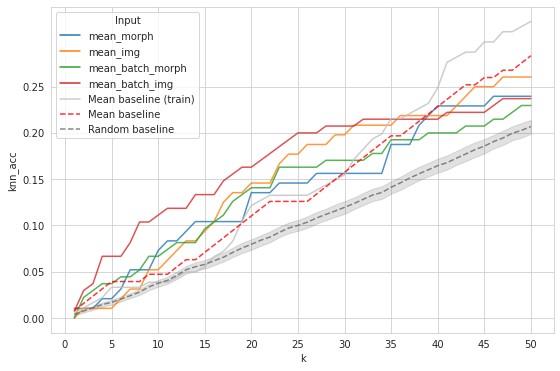

<IPython.core.display.Javascript object>

In [281]:
fig, ax = plot_translation_performance(
    all_knn_results,
    hue="input",
    ymax=0.3,
    title="",
    random_baseline=cc_random_baseline_knn_accs,
    mean_baseline=cc_mean_baseline_knn_accs,
    mean_train_baseline=cc_mean_batch_baseline_knn_accs,
    figsize=[9, 6],
    cmap=None,
    style=None,
    style_order=None,
    param_title=None,
    legend_title="Input",
    alpha=0.8,
)

---

## Visualization of the predictions

We will now visualize the translation map for different model configuration to better understand why the performance is so much lower than expected.

In [64]:
regulatory_embs = embedding_dict["regulatory_gene_embeddings_using_cmap"].copy()
regulatory_emb_clusters = regulatory_embs.loc[:, "cluster"]
regulatory_embs = regulatory_embs.drop(columns=["cluster"])
regulatory_embs = pd.DataFrame(
    normalize(regulatory_embs),
    index=regulatory_embs.index,
    columns=regulatory_embs.columns,
)

<IPython.core.display.Javascript object>

In [65]:
reg_embs_w_means = regulatory_embs.copy()
reg_embs_w_means.loc["TRAIN MEAN"] = np.array(
    regulatory_embs.loc[list(train_targets)].mean(axis=0)
)
reg_embs_w_means.loc["MEAN"] = np.array(regulatory_embs.mean(axis=0))

<IPython.core.display.Javascript object>

In [66]:
pert_embs = embedding_dict["mean_jump_img_embs"]
pert_embs.index = np.array(pert_embs.label)
pert_embs_w_means = pert_embs._get_numeric_data().copy()
pert_embs_w_means.loc["TRAIN MEAN"] = np.array(
    pert_embs.loc[list(train_targets)].mean(axis=0)
)
pert_embs_w_means.loc["MEAN"] = np.array(pert_embs.mean(axis=0))

<ipython-input-66-cdd46a097323>:5: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  pert_embs.loc[list(train_targets)].mean(axis=0)
<ipython-input-66-cdd46a097323>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  pert_embs_w_means.loc["MEAN"] = np.array(pert_embs.mean(axis=0))


<IPython.core.display.Javascript object>

### Sample visualization

In [83]:
reg_pred_nns, reg_pred_embs = get_jump_nn_prediction_dict(
    pert_embs._get_numeric_data(),
    reg_embs_w_means,
    list(train_targets),
    list(train_targets) + list(test_targets),
    model_type="ntk",
    model_params_dict={"reg": 0},
    use_y_train_mean=False,
    use_y_mean=False,
    n_neighbors_weights_features=0,
    n_weight_encodings=10,
    neighbor_weight_encoding="gauss",
    append_neighbor_embs=None,
    rff_sigma=1,
    use_batch_labels=False,
    batch_labels=None,
    normalize_prediction=False,
    return_predicted_embeddings=True,
)

<IPython.core.display.Javascript object>

In [84]:
target = "ERG"

genes = []
reg_preds = []
for (gene, pred_emb) in reg_pred_embs:
    genes.append(gene)
    reg_preds.append(list(pred_emb.squeeze()))
genes = np.array(genes)
reg_preds = np.array(reg_preds)


reg_pred = reg_preds[genes == target]

<IPython.core.display.Javascript object>

In [80]:
target_pert_tsne_embs, target_reg_tsne_embs = get_tsne_translation_prediction(
    pert_embs=pert_embs_w_means,
    reg_embs=reg_embs_w_means,
    reg_pred=reg_pred,
    target=target,
    perplexity=None,
)

/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


<IPython.core.display.Javascript object>

#### Image embeddings

<IPython.core.display.Javascript object>


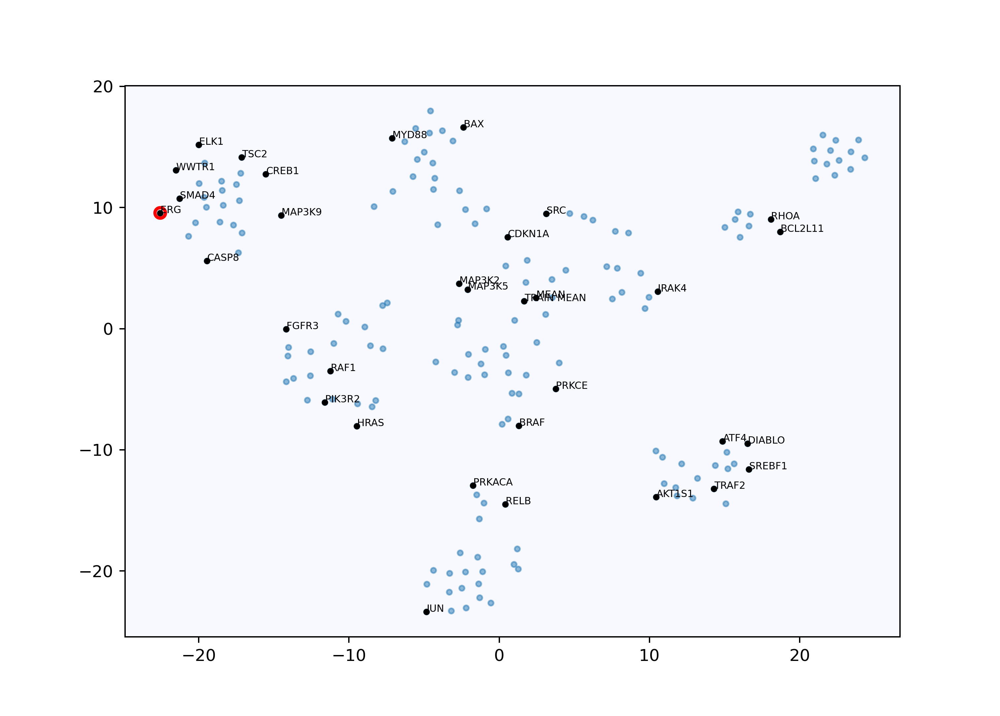

<IPython.core.display.Javascript object>

In [81]:
fig, ax = plt.subplots(figsize=[10, 6], dpi=300)
fig, ax = plot_translation_tsne(
    embs=target_pert_tsne_embs,
    prediction=target,
    fig=fig,
    ax=ax,
    lw=2,
    alpha=1,
    target_size=20,
    pred_size=40,
    size=10,
    color="tab:blue",
    p_alpha=0.5,
    neighbor_size=8,
    mark_neighbors=list(train_targets) + ["TRAIN MEAN", "MEAN", target],
    label_points=list(train_targets) + ["TRAIN MEAN", "MEAN", target],
    reg_label_size=6,
)
ax.set_facecolor("ghostwhite")

---

In [85]:
np.linalg.norm(reg_preds, axis=1)

array([1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 0.74735704, 0.41113862, 0.41859312, 0.56455889,
       0.76072409, 0.52082869, 0.55135525, 0.82362905, 0.58915936,
       0.43444814, 0.54817937, 0.5933726 , 0.54512766, 0.8109801 ,
       0.87363142, 0.4984218 , 0.5976681 , 0.81968588, 0.5516551 ,
       0.72808473, 0.87733336, 0.66332722, 0.60150421, 0.49729566,
       0.68418316, 0.62820959, 0.64485533, 0.43222665, 0.68821027,
       0.54871014, 0.54105477, 0.57674604, 0.45403529, 0.61383236,
       0.58524266, 0.6611208 , 0.60629741, 0.90061139, 0.63537594,
       0.79344773, 0.58109169, 0.39244746, 0.54553841, 0.64099

<IPython.core.display.Javascript object>

#### Regulatory embeddings

<IPython.core.display.Javascript object>


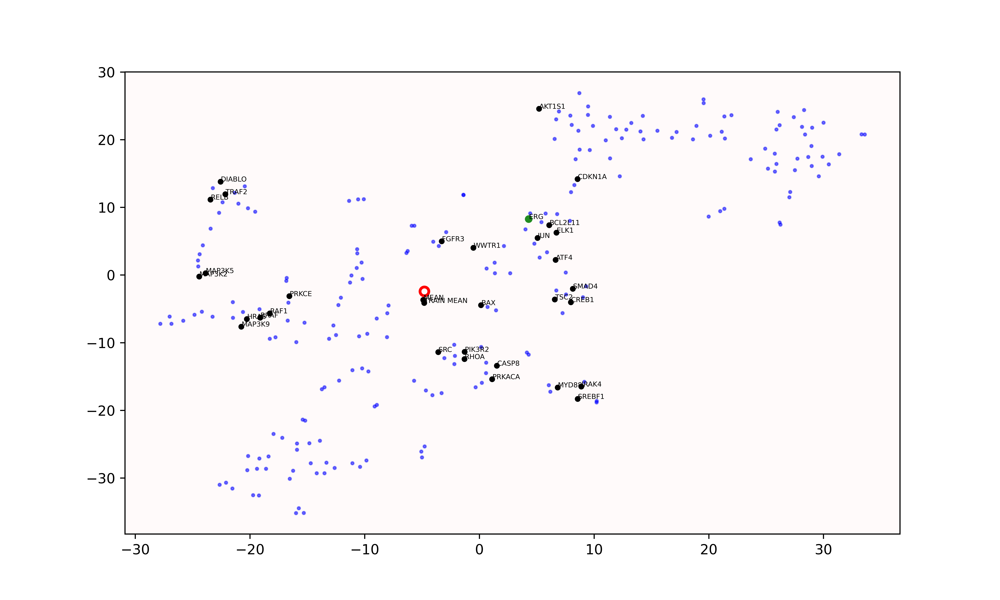

<IPython.core.display.Javascript object>

In [82]:
fig, ax = plt.subplots(figsize=[10, 6], dpi=600)
fig, ax = plot_translation_tsne(
    embs=target_reg_tsne_embs,
    target=target,
    fig=fig,
    ax=ax,
    prediction="PREDICTION",
    pred_size=40,
    pred_color="r",
    target_color="forestgreen",
    lw=2,
    alpha=1,
    target_size=20,
    size=4,
    p_alpha=0.5,
    neighbor_size=10,
    mark_neighbors=list(train_targets) + ["TRAIN MEAN", "MEAN", target],
    reg_label_size=5,
    label_points=list(train_targets) + ["TRAIN MEAN", "MEAN", target],
)
ax.set_facecolor("snow")

---

### Systematic visualization

In [ ]:
import warnings

warnings.filterwarnings("ignore")
viz_output_dir = (
    "../../../../data/experiments/translation_results/jump/linear_reg_pred_viz_batch/"
)
viz_pert_emb_dir = os.path.join(viz_output_dir, "pert_embs")
viz_reg_emb_dir = os.path.join(viz_output_dir, "reg_embs")
os.makedirs(viz_pert_emb_dir, exist_ok=True)
os.makedirs(viz_reg_emb_dir, exist_ok=True)

reg_pred_embs = get_jump_nn_prediction_dict(
    pert_embs._get_numeric_data(),
    regulatory_embs,
    list(train_targets),
    list(train_targets) + list(test_targets),
    model_type="linear_regression",
    model_params_dict={"reg": 0},
    use_y_train_mean=False,
    use_y_mean=False,
    n_neighbors_weights_features=0,
    n_weight_encodings=10,
    neighbor_weight_encoding="gauss",
    append_neighbor_embs=None,
    rff_sigma=1,
    use_batch_labels=False,
    batch_labels=None,
    normalize_prediction=False,
    return_predicted_embeddings=True,
)[1]

genes = []
reg_preds = []
for (gene, pred_emb) in reg_pred_embs:
    genes.append(gene)
    reg_preds.append(list(pred_emb.squeeze()))
genes = np.array(genes)
reg_preds = np.array(reg_preds)


for target in tqdm(list(train_targets) + list(test_targets)):
    reg_pred = reg_preds[genes == target]
    reg_embs_w_means = regulatory_embs.copy()
    reg_embs_w_means.loc["TRAIN MEAN"] = np.array(
        regulatory_embs.loc[list(train_targets)].mean(axis=0)
    )
    reg_embs_w_means.loc["MEAN"] = np.array(regulatory_embs.mean(axis=0))
    target_pert_tsne_embs, target_reg_tsne_embs = get_tsne_translation_prediction(
        pert_embs=pert_embs_w_means,
        reg_embs=reg_embs_w_means,
        reg_pred=reg_pred,
        target=target,
        perplexity=None,
    )

    fig, ax = plt.subplots(figsize=[7, 4], dpi=600)
    fig, ax = plot_translation_tsne(
        embs=target_pert_tsne_embs,
        prediction=target,
        fig=fig,
        ax=ax,
        lw=2,
        alpha=1,
        target_size=20,
        pred_size=40,
        size=10,
        color="tab:blue",
        p_alpha=0.5,
        neighbor_size=8,
        mark_neighbors=list(train_targets) + ["TRAIN MEAN", "MEAN"],
        label_points=list(train_targets) + ["TRAIN MEAN", "MEAN", target],
        reg_label_size=6,
    )
    ax.set_facecolor("ghostwhite")
    ax.set_title("Perturbation embeddings")
    plt.savefig(os.path.join(viz_pert_emb_dir, "{}.png".format(target)))
    plt.close()

    fig, ax = plt.subplots(figsize=[7, 4], dpi=600)
    fig, ax = plot_translation_tsne(
        embs=target_reg_tsne_embs,
        target=target,
        fig=fig,
        ax=ax,
        prediction="PREDICTION",
        pred_size=40,
        pred_color="r",
        target_color="forestgreen",
        lw=2,
        alpha=1,
        target_size=20,
        size=4,
        p_alpha=0.5,
        neighbor_size=10,
        mark_neighbors=list(train_targets) + ["TRAIN MEAN", "MEAN"],
        reg_label_size=5,
        label_points=list(train_targets) + ["TRAIN MEAN", "MEAN", target],
    )
    ax.set_facecolor("snow")
    ax.set_title("Regulatory embeddings")
    plt.savefig(os.path.join(viz_reg_emb_dir, "{}.png".format(target)))
    plt.close()

---

## Analyses of predictions

### Limited prediction capacity of the translation models

The previous visualization suggested that for many test targets the models fall back to predict regulatory embeddings close to the mean of the training conditions somewhat independent of the input features.

We will now quantify that behavior by looking at the proportion for both training and test targets for different models for which the mean of the training respectively to global mean is among the k-nearest neighbors of the prediction. We will again primarily look at the image embeddings here.

In [99]:
regulatory_embs = embedding_dict["regulatory_gene_embeddings_using_cmap"].copy()
regulatory_emb_clusters = regulatory_embs.loc[:, "cluster"]
regulatory_embs = regulatory_embs.drop(columns=["cluster"])
# regulatory_embs.loc["MEAN_RAW"] = np.array(regulatory_embs.mean(axis=0))
regulatory_embs = pd.DataFrame(
    normalize(regulatory_embs),
    index=regulatory_embs.index,
    columns=regulatory_embs.columns,
)

<IPython.core.display.Javascript object>

In [58]:
reg_embs_w_means = regulatory_embs.copy()
reg_embs_w_means.loc["TRAIN_MEAN"] = np.array(
    regulatory_embs.loc[list(train_targets)].mean(axis=0)
)
reg_embs_w_means.loc["MEAN"] = np.array(regulatory_embs.mean(axis=0))

<IPython.core.display.Javascript object>

In [1172]:
pert_embs = embedding_dict["mean_jump_img_embs"]
pert_embs.index = np.array(pert_embs.label)
pert_embs_w_means = pert_embs._get_numeric_data().copy()
pert_embs_w_means.loc["TRAIN_MEAN"] = np.array(
    pert_embs.loc[list(train_targets)].mean(axis=0)
)
pert_embs_w_means.loc["MEAN"] = np.array(pert_embs.mean(axis=0))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

#### Synthetic Intervention model

In [1204]:
reg_pred_nns, reg_pred_embs = get_jump_nn_prediction_dict(
    pert_embs._get_numeric_data(),
    reg_embs_w_means,
    list(train_targets),
    list(train_targets) + list(test_targets),
    model_type="synthetic_intervention",
    model_params_dict={"reg": 0},
    use_y_train_mean=False,
    use_y_mean=False,
    n_neighbors_weights_features=0,
    n_weight_encodings=10,
    neighbor_weight_encoding="gauss",
    append_neighbor_embs=None,
    rff_sigma=1,
    use_batch_labels=False,
    batch_labels=None,
    normalize_prediction=False,
    return_predicted_embeddings=True,
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1205]:
si_mean_hit = get_mean_hit_fraction(
    reg_pred_nns, train_targets, test_targets, mean_id="MEAN"
)
si_train_mean_hit = get_mean_hit_fraction(
    reg_pred_nns, train_targets, test_targets, mean_id="TRAIN_MEAN"
)
si_means_hit = pd.concat([si_mean_hit, si_train_mean_hit])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1214]:
lr_means_hit

,k,rel_knn_hit,target_type,ID
0,1,0.000000,train,MEAN
1,1,0.048611,test,MEAN
2,2,0.000000,train,MEAN
3,2,0.381944,test,MEAN
4,3,0.000000,train,MEAN
...,...,...,...,...
95,48,1.000000,test,TRAIN_MEAN
96,49,1.000000,train,TRAIN_MEAN
97,49,1.000000,test,TRAIN_MEAN
98,50,1.000000,train,TRAIN_MEAN


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

#### Linear regression model

In [1206]:
reg_pred_nns, reg_pred_embs = get_jump_nn_prediction_dict(
    pert_embs._get_numeric_data(),
    reg_embs_w_means,
    list(train_targets),
    list(train_targets) + list(test_targets),
    model_type="linear_regression",
    model_params_dict={"reg": 0},
    use_y_train_mean=False,
    use_y_mean=False,
    n_neighbors_weights_features=0,
    n_weight_encodings=10,
    neighbor_weight_encoding="gauss",
    append_neighbor_embs=None,
    rff_sigma=1,
    use_batch_labels=False,
    batch_labels=None,
    normalize_prediction=False,
    return_predicted_embeddings=True,
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1207]:
lr_mean_hit = get_mean_hit_fraction(
    reg_pred_nns, train_targets, test_targets, mean_id="MEAN"
)
lr_train_mean_hit = get_mean_hit_fraction(
    reg_pred_nns, train_targets, test_targets, mean_id="TRAIN_MEAN"
)
lr_means_hit = pd.concat([lr_mean_hit, lr_train_mean_hit])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### NTK without regularization

In [102]:
reg_pred_nns_eucl, reg_pred_embs = get_jump_nn_prediction_dict(
    pert_embs._get_numeric_data(),
    reg_embs_w_means,
    list(train_targets),
    list(train_targets) + list(test_targets),
    model_type="ntk",
    model_params_dict={"reg": 0},
    use_y_train_mean=False,
    use_y_mean=False,
    n_neighbors_weights_features=0,
    n_weight_encodings=10,
    neighbor_weight_encoding="gauss",
    append_neighbor_embs=None,
    rff_sigma=1,
    use_batch_labels=False,
    batch_labels=None,
    normalize_prediction=False,
    return_predicted_embeddings=True,
)

<IPython.core.display.Javascript object>

In [122]:
for i in range(len(reg_pred_nns_eucl)):
    gene, eucl_pred_i = reg_pred_nns_eucl[i]
    gene, cos_pred_i = reg_pred_nns_cosine[i]
    eucl_pred_i = eucl_pred_i[eucl_pred_i != "TRAIN MEAN"]
    eucl_pred_i = eucl_pred_i[eucl_pred_i != "MEAN"]
    eucl_pred_i = eucl_pred_i[eucl_pred_i != "RAW_MEAN"]
    cos_pred_i = cos_pred_i[cos_pred_i != "TRAIN MEAN"]
    cos_pred_i = cos_pred_i[cos_pred_i != "MEAN"]
    cos_pred_i = cos_pred_i[cos_pred_i != "RAW_MEAN"]
    print(gene, np.all(cos_pred_i == eucl_pred_i))

JUN True
ERG True
AKT1S1 True
MYD88 True
DIABLO True
PIK3R2 True
SMAD4 True
PRKCE True
ELK1 True
TRAF2 True
RHOA True
CREB1 True
RELB True
CDKN1A True
MAP3K2 True
BCL2L11 True
SREBF1 True
BRAF True
CASP8 True
MAP3K9 True
PRKACA True
MAP3K5 True
SRC True
HRAS True
ATF4 True
WWTR1 True
IRAK4 True
TSC2 True
BAX True
RAF1 True
FGFR3 True
RRM2 True
TPM1 True
UCHL5 True
EXO1 True
LRP1 True
ALOX5 True
TUBB6 True
TUBB2B True
NEK2 True
SUV39H1 True
AMPH True
FEN1 True
TINAGL1 True
TPM2 True
CDC45 True
TNNT2 True
MCM3 True
CYBA True
YWHAQ True
SPC24 True
FKBP4 True
TRIB3 True
AXL True
DHRS2 True
PRKCA True
EPB41L3 True
CDK2 True
HJURP True
CKS2 True
TNNT1 True
TK1 True
TUBA1A True
TGM2 True
FOS True
SKP2 True
PLAT True
TUBB True
TPX2 True
AURKB True
SDC2 True
STC2 True
CCND2 True
MAGEA1 True
PRSS23 True
CD40 True
LBH True
BIRC5 True
SPARC True
NDN True
MCM7 True
CDK6 True
TONSL True
DUSP6 True
INHBA True
PRC1 True
FSTL1 True
AURKA True
KIF2C True
KRT18 True
KLK6 True
PRAME True
VIM True
MYH9 Tru

<IPython.core.display.Javascript object>

In [93]:
reg_pred_nns

[('JUN',
  array(['JUN', 'FOS', 'ELK1', 'CEBPA', 'AQP1', 'ERG', 'RUNX1', 'BCL2L11',
         'TCF4', 'ATF4', 'MAGEA11', 'EEF1A2', 'MAPK8', 'CCND2', 'CDK6',
         'NCOR2', 'EPB41L3', 'TUBB2B', 'CLU', 'BAX', 'CDKN1A', 'LDOC1',
         'TRIB3', 'RARA', 'KRT8', 'CDK14', 'TRAIN MEAN', 'MDC1', 'MYC',
         'THRA', 'WWTR1', 'MEAN', 'MAPK7', 'MSH2', 'PCNA', 'HSPA1B', 'FHL2',
         'TPX2', 'SMAD4', 'CDK2', 'PTN', 'FOXO1', 'CCNB2', 'PRAME', 'E2F1',
         'YWHAQ', 'HSP90AB1', 'STC2', 'MCM10', 'EXO1', 'FOXM1', 'TRAF2',
         'DIABLO', 'CDC6', 'TENM3', 'TNNT1', 'SUV39H1', 'TK1', 'KPNA2',
         'SDC1', 'CDC42', 'FEN1', 'GSK3B', 'DSP', 'CKS2', 'HSPB1', 'CREB1',
         'TUBA1A', 'SKP2', 'CCNA2', 'CRYAB', 'TTK', 'CDK1', 'TSC2', 'TGFB1',
         'S100A2', 'UCHL5', 'IGFBP5', 'KRT18', 'GLI2', 'BCR', 'FSTL1',
         'LZTS2', 'MAGED1', 'SDC3', 'INHBA', 'NDC80', 'RPS6KB1', 'CD40',
         'CASP8', 'SFN', 'CDCA3', 'FKBP4', 'MCM7', 'BMP4', 'EFEMP1', 'RAF1',
         'APPBP2', 'TUBB', '

<IPython.core.display.Javascript object>

In [1209]:
ntk_0_mean_hit = get_mean_hit_fraction(
    reg_pred_nns, train_targets, test_targets, mean_id="MEAN"
)
ntk_0_train_mean_hit = get_mean_hit_fraction(
    reg_pred_nns, train_targets, test_targets, mean_id="TRAIN_MEAN"
)
ntk_0_means_hit = pd.concat([ntk_0_mean_hit, ntk_0_train_mean_hit])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

#### NTK with 5 regularization

In [1210]:
reg_pred_nns, reg_pred_embs = get_jump_nn_prediction_dict(
    pert_embs._get_numeric_data(),
    reg_embs_w_means,
    list(train_targets),
    list(train_targets) + list(test_targets),
    model_type="ntk",
    model_params_dict={"reg": 5},
    use_y_train_mean=False,
    use_y_mean=False,
    n_neighbors_weights_features=0,
    n_weight_encodings=10,
    neighbor_weight_encoding="gauss",
    append_neighbor_embs=None,
    rff_sigma=1,
    use_batch_labels=False,
    batch_labels=None,
    normalize_prediction=False,
    return_predicted_embeddings=True,
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1211]:
ntk_5_mean_hit = get_mean_hit_fraction(
    reg_pred_nns, train_targets, test_targets, mean_id="MEAN"
)
ntk_5_train_mean_hit = get_mean_hit_fraction(
    reg_pred_nns, train_targets, test_targets, mean_id="TRAIN_MEAN"
)
ntk_5_means_hit = pd.concat([ntk_5_mean_hit, ntk_5_train_mean_hit])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

#### NTK with 50 regularization

In [1245]:
reg_pred_nns, reg_pred_embs = get_jump_nn_prediction_dict(
    pert_embs._get_numeric_data(),
    reg_embs_w_means,
    list(train_targets),
    list(train_targets) + list(test_targets),
    model_type="ntk",
    model_params_dict={"reg": 50},
    use_y_train_mean=False,
    use_y_mean=False,
    n_neighbors_weights_features=0,
    n_weight_encodings=10,
    neighbor_weight_encoding="gauss",
    append_neighbor_embs=None,
    rff_sigma=1,
    use_batch_labels=False,
    batch_labels=None,
    normalize_prediction=False,
    return_predicted_embeddings=True,
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1246]:
ntk_50_mean_hit = get_mean_hit_fraction(
    reg_pred_nns, train_targets, test_targets, mean_id="MEAN"
)
ntk_50_train_mean_hit = get_mean_hit_fraction(
    reg_pred_nns, train_targets, test_targets, mean_id="TRAIN_MEAN"
)
ntk_50_means_hit = pd.concat([ntk_50_mean_hit, ntk_50_train_mean_hit])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1264]:
ntk_50_train_mean_hit

,k,rel_knn_hit,target_type,ID
0,1,0.903226,train,TRAIN_MEAN
1,1,1.000000,test,TRAIN_MEAN
2,2,1.000000,train,TRAIN_MEAN
3,2,1.000000,test,TRAIN_MEAN
4,3,1.000000,train,TRAIN_MEAN
...,...,...,...,...
95,48,1.000000,test,TRAIN_MEAN
96,49,1.000000,train,TRAIN_MEAN
97,49,1.000000,test,TRAIN_MEAN
98,50,1.000000,train,TRAIN_MEAN


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---

#### Summary

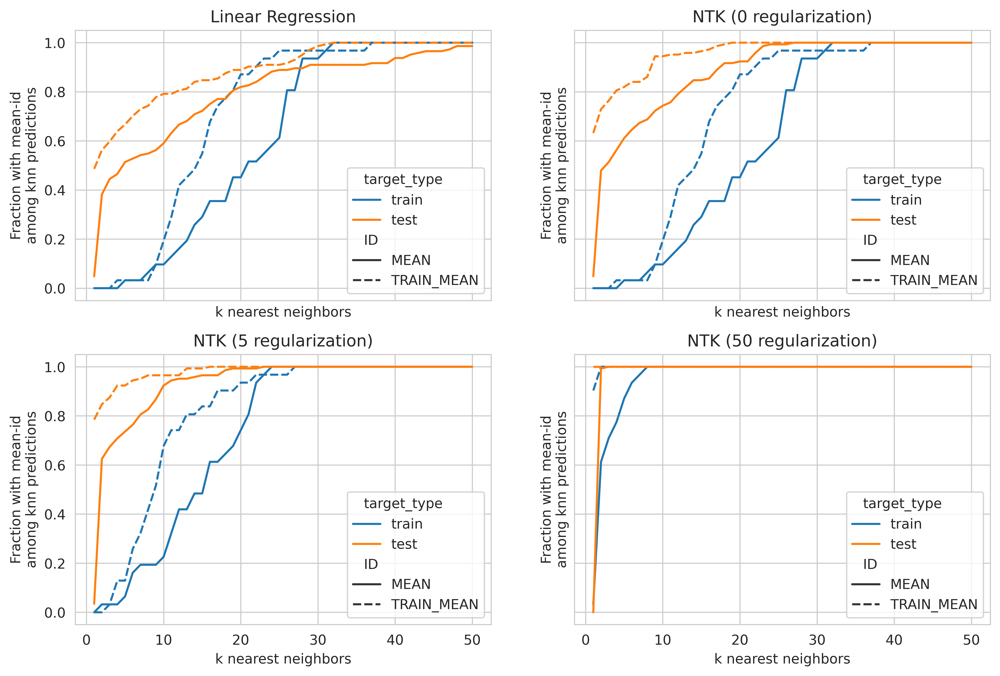

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1247]:
means_hit_dict = {
    "Linear Regression": lr_means_hit,
    "NTK (0 regularization)": ntk_0_means_hit,
    "NTK (5 regularization)": ntk_5_means_hit,
    "NTK (50 regularization)": ntk_50_means_hit,
}
fig, ax = plt.subplots(figsize=[12, 8], ncols=2, nrows=2, sharex=True, sharey=True)
ax = ax.flatten()
for i in range(4):
    k = list(means_hit_dict.keys())[i]
    ax[i].set_xlabel("k nearest neighbors")
    ax[i].set_ylabel("Fraction with mean-id\namong knn predictions")
    ax[i].set_title(k)
    ax[i] = sns.lineplot(
        data=means_hit_dict[k],
        x="k",
        y="rel_knn_hit",
        ax=ax[i],
        hue="target_type",
        style="ID",
    )

The plots above show two major characteristics of the learned translation maps:
- the stronger the regularization the more likely the model is to simply output the mean which is to be expected
- even for unregularized models that perfectly fit the training data, we find the mean of the training conditions to be fairly close by the actual target suggesting that our train targets are located around the center of the regulatory embedding space.

The latter can be explained by the fact that the way we construct the gene-gene interactome the genes targetted in the impactful gene perturbation settings, i.e. a superset of the training set used in this task will be chosen as the central part of the GGI. The centrality of these genes will be preserved by the graph encoding.

We will now perform a similar plot that instead of using the predictions of a model uses the actual regulatory embeddings to further highlight that this does not hold true for the test targets.

In [35]:
def get_true_knn_dict(embs):
    knns = []
    for gene in list(embs.index):
        knns.append((gene, get_nearest_neighbors_for_target(embs, gene).reshape(-1)))
    return knns

<IPython.core.display.Javascript object>

In [36]:
reg_embs_w_means_knn_dict = get_true_knn_dict(reg_embs_w_means)
reg_embs_mean_hit = get_mean_hit_fraction(
    reg_embs_w_means_knn_dict, train_targets, test_targets, mean_id="MEAN"
)
reg_embs_train_mean_hit = get_mean_hit_fraction(
    reg_embs_w_means_knn_dict, train_targets, test_targets, mean_id="TRAIN_MEAN"
)
reg_embs_means_hit = pd.concat([reg_embs_mean_hit, reg_embs_train_mean_hit])

/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fit

/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fit

/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fit

/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fit

/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fit

/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fit

<ipython-input-28-92acd8499c5d>:16: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  np.mean(mean_knn_hit_data.loc[test_targets, "knn_hit"] < k)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


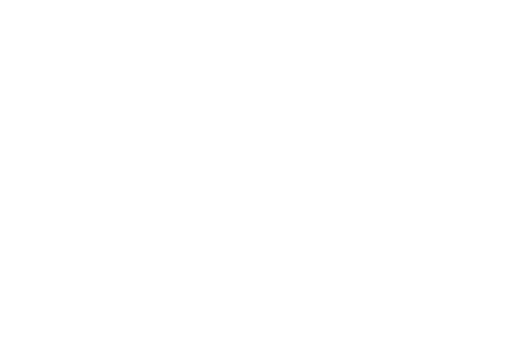

<IPython.core.display.Javascript object>


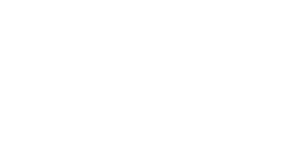

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1328]:
fig, ax = plt.subplots(figsize=[6, 4])
ax = sns.lineplot(
    data=reg_embs_means_hit, x="k", y="rel_knn_hit", hue="target_type", style="ID"
)
ax.set_xlabel("k nearest neighbors")
ax.set_ylabel("Fraction with mean-id\namong knn predictions")
ax.set_title("Ground truth")
plt.show()

The above plot suprisingly suggests that for each regulatory embedding the average of all regulatory embeddings is among the 40 nearest neighbors. Note that this is not a contradiction to the performance of the mean baseline on the test targets as the the kNN distance is not symmetric.

E.g. the two nearest neighbors of the samples 0, 1, 100, 1000 are (1,100), (0,100), (0,1), (1,100) respectively. Here while for 1000 the nearest neighbors are 1 and 100 but the for neither of them 1000 is a nearest neighbor.

To get a better idea of the manifold of the regulatory embeddings that maintains those distances, we will plot the regulatory embeddings using a MDS plot.

In [59]:
from sklearn.manifold import MDS

# plt.ioff()


def get_mds_embeddings(embs, n_components=3, metric="euclidean"):
    mds = MDS(n_components=n_components, metric=metric)
    md_embs = pd.DataFrame(
        mds.fit_transform(embs),
        index=embs.index,
        columns=["mds{}".format(i) for i in range(1, n_components + 1)],
    )
    print("Stress", mds.stress_)
    return md_embs

<IPython.core.display.Javascript object>

In [60]:
reg_embs_w_means

,0,1,2,3,4,5,6,7,8,9,...,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023
PTN,0.020621,0.002489,-0.005516,-0.007126,-0.029236,-0.024869,0.018825,-0.023408,-0.031863,0.019076,...,-0.001162,0.011433,-0.044142,0.007482,0.048271,0.027027,0.058301,0.005743,-0.026493,0.027219
KLK6,-0.009562,-0.031214,-0.021108,0.005810,-0.013405,0.054365,-0.019600,0.034640,-0.001706,-0.030593,...,0.053542,-0.028813,-0.024528,0.016104,-0.008676,-0.003218,0.049097,-0.007915,0.032668,-0.025057
AURKB,0.010054,0.051936,0.000774,0.040030,-0.009459,0.042650,-0.026297,0.041686,0.041158,-0.026281,...,-0.020084,-0.002375,-0.017408,0.027855,0.050701,0.007774,-0.078106,-0.028691,0.031391,0.039255
TRAF2,-0.033641,0.047373,0.036253,0.044709,0.018364,0.057689,0.036436,0.012604,-0.032339,-0.006097,...,0.013899,0.042932,-0.020774,0.010073,0.015987,-0.017113,-0.069317,0.012941,0.012218,0.031543
TNNC1,-0.029660,-0.007668,-0.032735,0.035432,-0.017704,0.006697,-0.015606,0.020541,0.015908,-0.024423,...,0.000300,-0.002128,-0.011491,0.002992,0.060401,-0.010716,0.000112,-0.038240,0.020448,-0.006281
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CASP8,0.009807,0.007182,0.014846,0.011632,0.012559,0.021077,0.045219,0.007100,-0.047362,-0.008174,...,0.006034,0.052235,0.031111,0.004388,0.018741,0.002783,-0.019839,0.021513,-0.025391,-0.013092
SERPINE1,-0.007755,-0.047082,-0.023703,-0.010677,-0.032659,0.008273,-0.004489,0.016165,0.031140,0.016912,...,0.008285,-0.028436,-0.009732,0.028382,0.006558,0.065159,0.060535,0.012568,-0.035506,-0.016997
MEAN_RAW,0.029933,0.029705,-0.001387,0.001074,-0.000343,0.002762,0.000541,-0.016131,0.017734,0.000335,...,-0.019110,0.029920,-0.043828,0.031892,0.009205,0.023293,-0.044014,0.042107,-0.015822,0.028131
TRAIN_MEAN,0.001152,0.008733,0.001044,0.002425,0.006952,0.008501,0.018240,-0.011664,-0.003318,-0.004170,...,-0.001959,0.022171,-0.001009,0.004221,-0.006034,0.009340,-0.018390,0.019518,-0.006325,0.009579


<IPython.core.display.Javascript object>

In [61]:
md_reg_embs = get_mds_embeddings(reg_embs_w_means)
md_reg_embs["c"] = "y"
md_reg_embs.loc[list(train_targets), "c"] = "b"
md_reg_embs.loc[list(test_targets), "c"] = "g"
md_reg_embs.loc[["TRAIN_MEAN", "MEAN"], "c"] = "k"
md_reg_embs.loc["MEAN_RAW", "c"] = "r"

Stress 3282.311055569722


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


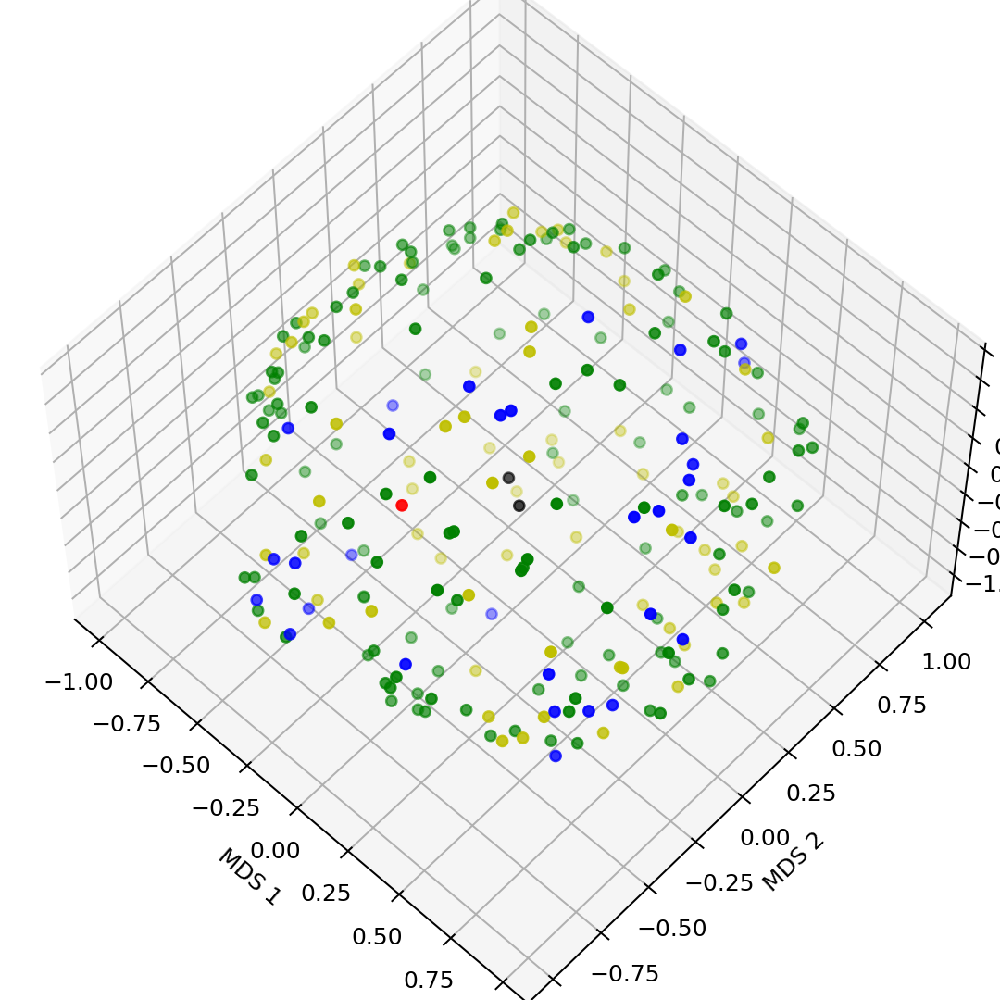

<ipython-input-62-3f352655b586>:6: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)  # Method 1


Text(0.5, 0, 'MDS 3')

<IPython.core.display.Javascript object>

In [62]:
from importlib import reload
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(6, 6), dpi=150)

ax = Axes3D(fig)  # Method 1
# ax = fig.add_subplot(111, projection='3d') # Method 2


ax.scatter(
    md_reg_embs["mds1"],
    md_reg_embs["mds2"],
    md_reg_embs["mds3"],
    c=md_reg_embs["c"],
    marker="o",
)
ax.set_xlabel("MDS 1")
ax.set_ylabel("MDS 2")
ax.set_zlabel("MDS 3")
# for angle in range(0, 360):
#     fig = plt.figure(figsize=(6, 6))
#     ax = Axes3D(fig)
#     ax.scatter(
#         md_reg_embs["mds1"],
#         md_reg_embs["mds2"],
#         md_reg_embs["mds3"],
#         c=md_reg_embs["c"],
#         marker="o",
#     )
#     ax.set_xlabel("MDS 1")
#     ax.set_ylabel("MDS 2")
#     ax.set_zlabel("MDS 3")
#     ax.view_init(30, angle)
#     plt.show()
#     plt.pause(0.001)
#     plt.close()

In [1389]:
from mpl_toolkits.mplot3d import axes3d

axes3d.get_test_data(0.1)[0].shape

(60, 60)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

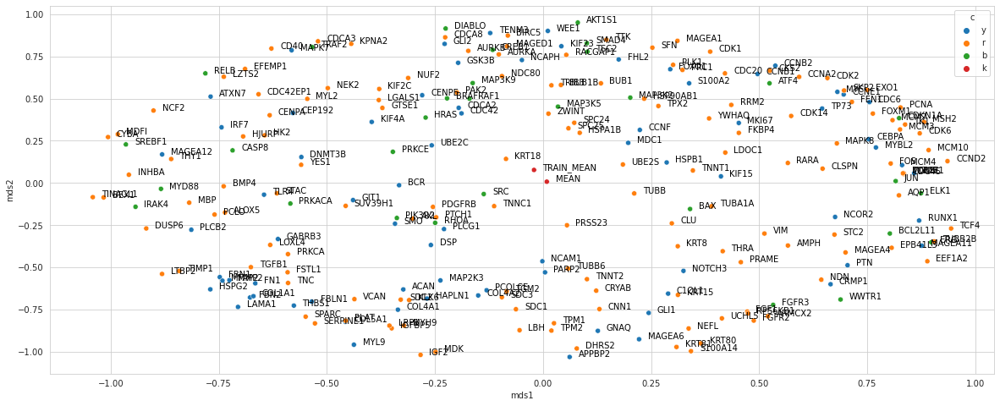

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1381]:
fig, ax = plt.subplots(figsize=[20, 8])
ax = sns.scatterplot(data=md_reg_embs, x="mds1", y="mds2", hue="c")
label_point(
    np.array(md_reg_embs.loc[:, "mds1"]),
    np.array(md_reg_embs.loc[:, "mds2"]),
    np.array(md_reg_embs.index).astype("str"),
    ax=ax,
    reg_size=10,
)

---

## Data export